In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pickle
import numpy as np
import numpy.ma as ma
import pandas as pd
from collections import defaultdict

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.colors import Normalize
from matplotlib.cm import get_cmap
from matplotlib import colormaps
import matplotlib.patheffects as pe
import matplotlib.patheffects as path_effects

import seaborn as sns
from astropy.stats import knuth_bin_width

from amespahdbpythonsuite.amespahdb import AmesPAHdb
from amespahdbpythonsuite import observation
from amespahdbpythonsuite import transitions
from amespahdbpythonsuite.transitions import Transitions

import os
import re 

In [3]:
# sns.set_style("whitegrid")
sns.set_context("paper", font_scale=1.2) #, rc={"grid.linewidth": 0.5})
def set_plot_style(dpi=300):
    mpl.rcParams.update({
        # Font and text
        "font.family": "Arial",
        "font.size": 14,
        "pdf.fonttype": 42,  # TrueType fonts (good for Illustrator)
        "ps.fonttype": 42,

        # Axes
        "axes.labelsize": 16,
        "axes.titlesize": 18,
        "axes.linewidth": 1.0,

        # Ticks
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "xtick.major.size": 5,
        "xtick.major.width": 1.0,
        "ytick.major.size": 5,
        "ytick.major.width": 1.0,

        # Legend
        "legend.frameon": False,
        "legend.fontsize": 14,

        # Figure
        "figure.dpi": dpi
    })

# Define height colors once
cmap = plt.get_cmap("YlGnBu")
height_colors = {"900": cmap(0.2), "950": cmap(0.55), "1000": cmap(0.9)}

def format_formula(formula):
    return "$" + re.sub(r"(\d+)", r"_{\1}", formula) + "$"

def extract_carbon_count(formula):
    match = re.match(r"C(\d+)", formula)
    return int(match.group(1)) if match else 0

output_dir = "final_results"
os.makedirs(output_dir, exist_ok=True)


# Presets for PAHdb 

## Load the general data: Databases & Observation files

In [4]:
#load the AmesPAHdb
# The AmesPAHdb is a collection of PAH spectra and properties.
# It can be used to analyze and compare PAH spectra, as well as to retrieve PAH properties.
pahdb_versions = {
    "v1": "PAHdb/pahdb-theoretical-v1.20.xml",
    "v3": "PAHdb/pahdb-theoretical-v3.20.xml",
    "v4": "PAHdb/pahdb-theoretical-v4.00.xml"
}
pahdb = {k: AmesPAHdb(filename=v, cache=True) for k, v in pahdb_versions.items()}
pahdb_v1 = pahdb["v1"]
pahdb_v3 = pahdb["v3"]
pahdb_v4 = pahdb["v4"]
print(f"Loaded PAHdb versions: {list(pahdb.keys())}")

                 AmesPAHdbPythonSuite
                 
                          by
                          
                Dr. Christiaan Boersma
                
                          and
                         
             Dr. Alexandros Maragkoudakis
             
               Dr. Matthew J. Shannanon
               
                  Dr. Joseph E. Roser
                 

       SUITE VERSION: 0.5.0.post90.dev0+gbeebb7c       

           WEBSITE: WWW.ASTROCHEM.ORG/PAHDB/           

          CONTACT: CHRISTIAAN.BOERSMA@NASA.GOV         

             RESTORING DATABASE FROM CACHE             

==
FILENAME                    : /var/folders/vv/2nq91_0d0lsfm6gcskyz__r40000gn/T/a80b922979ad89624d56b35e6a3a1f28.pkl
ORIGNINAL FILENAME          : PAHdb/pahdb-theoretical-v1.20.xml
PARSE TIME                  : 0:00:00.057212
DATABASE                    : theoretical
VERSION (DATE)              : 1.20 (2011-01-13)
COMMENT                     : 

This is the NASA Ames PAH IR 

In [5]:
specfiles = {
    "obs900": "VIMS/titan_spec_900_yerr.ipac",
    "obs950": "VIMS/titan_spec_950_yerr.ipac",
    "obs1000": "VIMS/titan_spec_1000_yerr.ipac"
}

obs_dict = {}
for key, specfile in specfiles.items():
    obs = observation.Observation(specfile)
    obs.abscissaunitsto("1/cm")
    obs_dict[key] = obs

obs900 = obs_dict["obs900"]
obs950 = obs_dict["obs950"]
obs1000 = obs_dict["obs1000"]


In [6]:
pahdb_v4

search_query1 = "mg=0 fe=0 si=0 o=0 h>0 neutral c<29 n>0"  # Only cationic PAHs
# # Perform the search
uids1 = pahdb_v4.search(search_query1)
len(uids1)

44

## Load the Cascade Emission Calculation Pickles & Make spectra

In [7]:
# Load transitions pickles
trans_pickles = {
    "v1.20_neutral": (pickle.load(open('pickles/combinedbranch_pickles/PAHdb_v1.20_neutral_transitions.pkl', 'rb')), pahdb_v1),
    "v3.20_neutral_anion": (pickle.load(open('pickles/combinedbranch_pickles/PAHdb_v3.20_neutral_anion_transitions.pkl', 'rb')), pahdb_v3),
    "v3.20_small_neutral_anion": (pickle.load(open('pickles/combinedbranch_pickles/PAHdb_v3.20_small_neutral_anion_transitions.pkl',
                                                  'rb')), pahdb_v3),
    "v4.00_neutral_anion": (pickle.load(open('pickles/PAHdb_v4.00_neutral_anion_transitions.pkl', 'rb')), pahdb_v4),
    "v4.00_small_neutral_anion": (pickle.load(open('pickles/PAHdb_v4.00_small_neutral_anion_transitions.pkl', 'rb')), pahdb_v4),
}

# Create transitions and compute convolved spectra
spectra = {}
for label, (trans_pkl, pahdb) in trans_pickles.items():
    trans = Transitions(trans_pkl, pahdb=pahdb.getdatabaseref())
    
    # Apply shift to everything except v4.00
    if not label.startswith("v4.00"):
        trans.shift(-15.0)
    
    spec = trans.convolve(grid=obs900.getgrid(), fwhm=15, multiprocessing=False)
    spectra[label] = spec

#check what happpens with the spectra if we use gaussian and fwhm = 10
spectra_gaussian = {}
for label, (trans_pkl, pahdb) in trans_pickles.items():
    trans_gaussian = Transitions(trans_pkl, pahdb=pahdb.getdatabaseref())

    if not label.startswith("v4.00"):
        trans_gaussian.shift(-15.0)

    spec_gaussian = trans_gaussian.convolve(grid=obs900.getgrid(), fwhm=15, multiprocessing=False, gaussian=True)
    spectra_gaussian[label] = spec_gaussian


                 TOTAL SHIFT: -15.0 /cm                

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                      FWHM: 15 /cm                     

                 TOTAL SHIFT: -15.0 /cm                

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                      FWHM: 15 /cm                     

                 TOTAL SHIFT: -15.0 /cm                

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                      FWHM: 15 /cm                     

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                      FWHM: 15 /cm                     

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                      FWHM: 15 

## Fit the spectra one time with NNLC

In [8]:
# Define your observations
observations = {
    "900": obs900,
    "950": obs950,
    "1000": obs1000
}

# Dictionary to store all fits
fits = {}

# Loop over spectra and observations
for label, spectrum in spectra.items():
    fits[label] = {}
    print(f"Fitting spectrum: {label}")
    for obs_label, obs in observations.items():
        if label == "v1.20_neutral":
            fit = spectrum.fit(obs, method="NNLS")
        else:
            fit = spectrum.fit(obs, method="NNLC", normalization="max")
        fits[label][obs_label] = fit


Fitting spectrum: v1.20_neutral
                       DOING NNLS                      

                       DOING NNLS                      

                       DOING NNLS                      

Fitting spectrum: v3.20_neutral_anion
                       DOING NNLC                      

                       DOING NNLC                      

                       DOING NNLC                      

Fitting spectrum: v3.20_small_neutral_anion
                       DOING NNLC                      

                       DOING NNLC                      

                       DOING NNLC                      

Fitting spectrum: v4.00_neutral_anion
                       DOING NNLC                      

                       DOING NNLC                      

                       DOING NNLC                      

Fitting spectrum: v4.00_small_neutral_anion
                       DOING NNLC                      

                       DOING NNLC                      

      

In [9]:
for spec_label, obs_fits in fits.items():
    for obs_label, fit in obs_fits.items():
        chi2 = fit.getchisquared()
        rchi2 = fit.getreducedchisquared()
        show = fit.get()
        print(f"Fit for {spec_label} on {obs_label}: Chi-squared = {chi2}, Reduced Chi-squared = {rchi2}, fitrchi2 = {show['rchi2']}")

Chi-squared: 15.946442913199125, DOF: 7, Reduced Chi-squared: 2.2780632733141606
Fit for v1.20_neutral on 900: Chi-squared = 15.946442913199125, Reduced Chi-squared = 2.2780632733141606, fitrchi2 = 2.278
Chi-squared: 7.7499227017615056, DOF: 8, Reduced Chi-squared: 0.9687403377201882
Fit for v1.20_neutral on 950: Chi-squared = 7.7499227017615056, Reduced Chi-squared = 0.9687403377201882, fitrchi2 = 0.969
Chi-squared: 3.629174907612504, DOF: 7, Reduced Chi-squared: 0.5184535582303578
Fit for v1.20_neutral on 1000: Chi-squared = 3.629174907612504, Reduced Chi-squared = 0.5184535582303578, fitrchi2 = 0.518
Chi-squared: 4.3226296832149, DOF: 7, Reduced Chi-squared: 0.6175185261735571
Fit for v3.20_neutral_anion on 900: Chi-squared = 4.3226296832149, Reduced Chi-squared = 0.6175185261735571, fitrchi2 = 0.618
Chi-squared: 1.197835320809547, DOF: 8, Reduced Chi-squared: 0.14972941510119336
Fit for v3.20_neutral_anion on 950: Chi-squared = 1.197835320809547, Reduced Chi-squared = 0.14972941510

In [10]:
# # Get fit uncertainty
# unc =fit1000.geterror()
# # Get fit breakdown.
# bd = fit1000.getbreakdown()
# # Update fit breakdown with uncertainty
# bd.update(unc)

# # Print key, value pairs.
# for k, v in bd.items():
#     print(f'{k}: {v:.3f}')

# fp = fit1000.sort(flux=True)
# new_uids = list(fp.keys())[:5]
# print(new_uids)

# new_pahs = pahdb_v1.getspeciesbyuid(new_uids)
# # Plot geometry
# new_geometry = pahdb_v1.getgeometrybyuid(new_uids)
# new_geometry.diagonalize()
# for uid in new_uids:
#     new_geometry.plot(uid)

In [11]:
for spec_label, obs_fits in fits.items():
    for obs_label, fit in obs_fits.items():
        print(f"Plotting fit for {spec_label} at {obs_label} km")
        if spec_label == "v1.20_neutral":
            fit.plot(wavelength=True, sigma=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, residual=True, sigma=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}_residual", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, charge=True, sigma=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}_charge", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, size=True, sigma=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}_size", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, sigma=True, composition=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}_composition", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(sizedistribution=True, sigma=True, save=True, output=f"{output_dir}/NNLSfit_{spec_label}_{obs_label}_sizedistribution", ftype="pdf", datalabel=f'{obs_label} km')
        else:
            fit.plot(wavelength=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, composition=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}_composition", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, residual=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}_residual", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, charge=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}_charge", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(wavelength=True, size=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}_size", ftype="pdf", datalabel=f'{obs_label} km')
            fit.plot(sizedistribution=True, sigma=True, save=True, output=f"{output_dir}/NNLCfit_{spec_label}_{obs_label}_sizedistribution", ftype="pdf", datalabel=f'{obs_label} km')


Plotting fit for v1.20_neutral at 900 km
Plotting fit for v1.20_neutral at 950 km
Plotting fit for v1.20_neutral at 1000 km
Plotting fit for v3.20_neutral_anion at 900 km
Plotting fit for v3.20_neutral_anion at 950 km
Plotting fit for v3.20_neutral_anion at 1000 km
Plotting fit for v3.20_small_neutral_anion at 900 km
Plotting fit for v3.20_small_neutral_anion at 950 km
Plotting fit for v3.20_small_neutral_anion at 1000 km
Plotting fit for v4.00_neutral_anion at 900 km
Plotting fit for v4.00_neutral_anion at 950 km
Plotting fit for v4.00_neutral_anion at 1000 km
Plotting fit for v4.00_small_neutral_anion at 900 km
Plotting fit for v4.00_small_neutral_anion at 950 km
Plotting fit for v4.00_small_neutral_anion at 1000 km


## MC fits

In [12]:
# Dictionary to store all mcfit results
mcfits = {}

for spec_label, spectrum in spectra.items():
    mcfits[spec_label] = {}
    for obs_label, obs in observations.items():
        print(f"Running mcfit for {spec_label} at {obs_label} km")
        if spec_label == "v1.20_neutral":
            mcfit = spectrum.mcfit(obs, samples=1000)
        else:
            mcfit = spectrum.mcfit(obs, samples=1000, normalization="max")
        mcfits[spec_label][obs_label] = mcfit


Running mcfit for v1.20_neutral at 900 km



samples: 100%|██████████| 1000/1000 [00:02<00:00, 351.20samples/s]


Running mcfit for v1.20_neutral at 950 km



samples: 100%|██████████| 1000/1000 [00:02<00:00, 375.30samples/s]


Running mcfit for v1.20_neutral at 1000 km



samples: 100%|██████████| 1000/1000 [00:02<00:00, 350.03samples/s]


Running mcfit for v3.20_neutral_anion at 900 km



samples: 100%|██████████| 1000/1000 [00:29<00:00, 34.08samples/s]


Running mcfit for v3.20_neutral_anion at 950 km



samples: 100%|██████████| 1000/1000 [00:37<00:00, 26.58samples/s]


Running mcfit for v3.20_neutral_anion at 1000 km



samples: 100%|██████████| 1000/1000 [00:39<00:00, 25.57samples/s]


Running mcfit for v3.20_small_neutral_anion at 900 km



samples: 100%|██████████| 1000/1000 [00:03<00:00, 274.97samples/s]


Running mcfit for v3.20_small_neutral_anion at 950 km



samples: 100%|██████████| 1000/1000 [00:04<00:00, 218.51samples/s]


Running mcfit for v3.20_small_neutral_anion at 1000 km



samples: 100%|██████████| 1000/1000 [00:04<00:00, 227.81samples/s]


Running mcfit for v4.00_neutral_anion at 900 km



samples: 100%|██████████| 1000/1000 [01:07<00:00, 14.86samples/s]


Running mcfit for v4.00_neutral_anion at 950 km



samples:   5%|▌         | 54/1000 [00:04<01:12, 12.99samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples: 100%|██████████| 1000/1000 [01:18<00:00, 12.81samples/s]


Running mcfit for v4.00_neutral_anion at 1000 km



samples: 100%|██████████| 1000/1000 [01:19<00:00, 12.56samples/s]


Running mcfit for v4.00_small_neutral_anion at 900 km



samples: 100%|██████████| 1000/1000 [00:04<00:00, 247.26samples/s]


Running mcfit for v4.00_small_neutral_anion at 950 km



samples: 100%|██████████| 1000/1000 [00:05<00:00, 168.55samples/s]


Running mcfit for v4.00_small_neutral_anion at 1000 km



samples: 100%|██████████| 1000/1000 [00:04<00:00, 224.81samples/s]


In [13]:
mcfits_gaussian = {}
for spec_label, spectrum in spectra_gaussian.items():
    mcfits_gaussian[spec_label] = {}
    for obs_label, obs in observations.items():
        print(f"Running mcfit for {spec_label} at {obs_label} km with gaussian")
        if spec_label == "v1.20_neutral":
            mcfit_gaussian = spectrum.mcfit(obs, samples=1000, gaussian=True)
        else:
            # Use normalization="max" for all except v1.20_neutral
            # and enable gaussian fitting
            mcfit_gaussian = spectrum.mcfit(obs, samples=1000, normalization="max", gaussian=True)
        mcfits_gaussian[spec_label][obs_label] = mcfit_gaussian

Running mcfit for v1.20_neutral at 900 km with gaussian



samples: 100%|██████████| 1000/1000 [00:01<00:00, 589.70samples/s]


Running mcfit for v1.20_neutral at 950 km with gaussian



samples: 100%|██████████| 1000/1000 [00:01<00:00, 575.29samples/s]


Running mcfit for v1.20_neutral at 1000 km with gaussian



samples: 100%|██████████| 1000/1000 [00:02<00:00, 366.77samples/s]


Running mcfit for v3.20_neutral_anion at 900 km with gaussian



samples: 100%|██████████| 1000/1000 [00:28<00:00, 34.82samples/s]


Running mcfit for v3.20_neutral_anion at 950 km with gaussian



samples: 100%|██████████| 1000/1000 [00:32<00:00, 31.05samples/s]


Running mcfit for v3.20_neutral_anion at 1000 km with gaussian



samples: 100%|██████████| 1000/1000 [00:33<00:00, 29.75samples/s]


Running mcfit for v3.20_small_neutral_anion at 900 km with gaussian



samples: 100%|██████████| 1000/1000 [00:03<00:00, 275.51samples/s]


Running mcfit for v3.20_small_neutral_anion at 950 km with gaussian



samples: 100%|██████████| 1000/1000 [00:03<00:00, 274.06samples/s]


Running mcfit for v3.20_small_neutral_anion at 1000 km with gaussian



samples: 100%|██████████| 1000/1000 [00:05<00:00, 181.33samples/s]


Running mcfit for v4.00_neutral_anion at 900 km with gaussian



samples: 100%|██████████| 1000/1000 [01:16<00:00, 13.09samples/s]


Running mcfit for v4.00_neutral_anion at 950 km with gaussian



samples:   8%|▊         | 80/1000 [00:06<01:17, 11.81samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  12%|█▏        | 118/1000 [00:09<01:10, 12.46samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  39%|███▉      | 392/1000 [00:32<00:50, 12.03samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  66%|██████▌   | 662/1000 [00:56<00:31, 10.81samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite

Running mcfit for v4.00_neutral_anion at 1000 km with gaussian



samples:  21%|██        | 207/1000 [00:18<01:07, 11.72samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  28%|██▊       | 279/1000 [00:25<01:12,  9.94samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  29%|██▉       | 291/1000 [00:26<01:05, 10.90samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuite/spectrum.py:692: RuntimeWarning: divide by zero encountered in scalar divide
  redchi2 = chi2/((len(obs.flux)-len(fit.data)))
samples:  33%|███▎      | 333/1000 [00:30<00:59, 11.27samples/s]/Users/floorstikkelbroeck/Documents/Github/AmesPAHdbPythonSuite_forked/amespahdbpythonsuit

Running mcfit for v4.00_small_neutral_anion at 900 km with gaussian



samples: 100%|██████████| 1000/1000 [00:04<00:00, 216.94samples/s]


Running mcfit for v4.00_small_neutral_anion at 950 km with gaussian



samples: 100%|██████████| 1000/1000 [00:05<00:00, 198.20samples/s]


Running mcfit for v4.00_small_neutral_anion at 1000 km with gaussian



samples: 100%|██████████| 1000/1000 [00:07<00:00, 129.72samples/s]


Plotting mcfit for v1.20_neutral at 900 km
Plotting mcfit for v1.20_neutral at 950 km
Plotting mcfit for v1.20_neutral at 1000 km
Plotting mcfit for v3.20_neutral_anion at 900 km
Plotting mcfit for v3.20_neutral_anion at 950 km
Plotting mcfit for v3.20_neutral_anion at 1000 km
Plotting mcfit for v3.20_small_neutral_anion at 900 km
Plotting mcfit for v3.20_small_neutral_anion at 950 km
Plotting mcfit for v3.20_small_neutral_anion at 1000 km
Plotting mcfit for v4.00_neutral_anion at 900 km
Plotting mcfit for v4.00_neutral_anion at 950 km
Plotting mcfit for v4.00_neutral_anion at 1000 km
Plotting mcfit for v4.00_small_neutral_anion at 900 km
Plotting mcfit for v4.00_small_neutral_anion at 950 km
Plotting mcfit for v4.00_small_neutral_anion at 1000 km


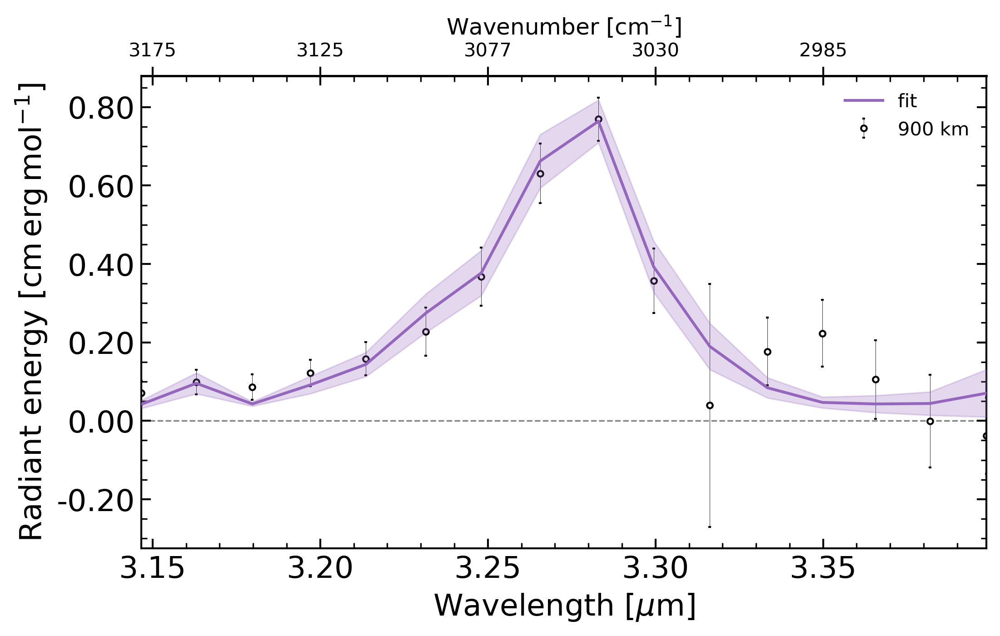

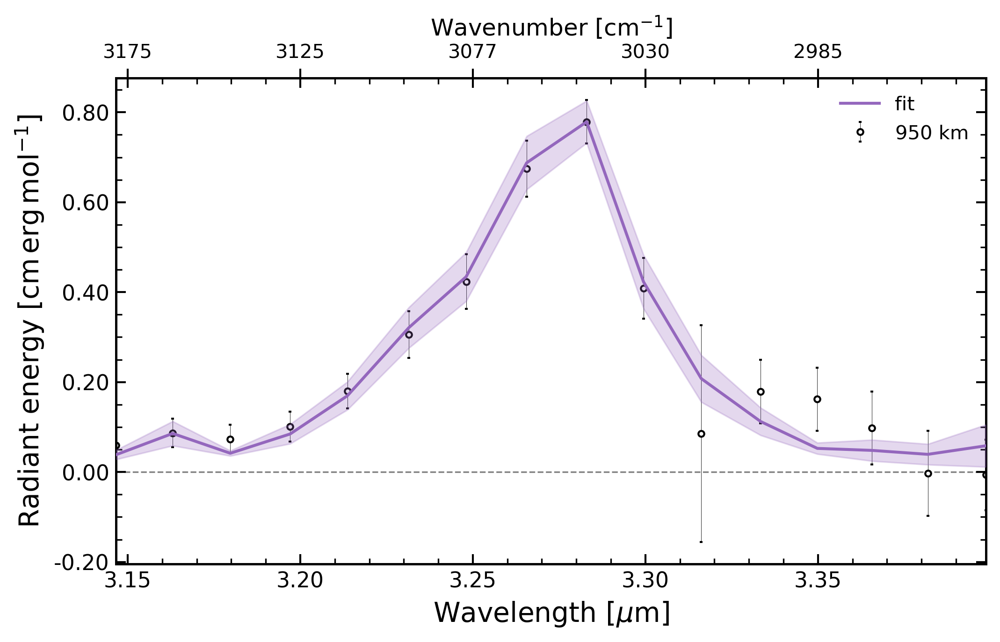

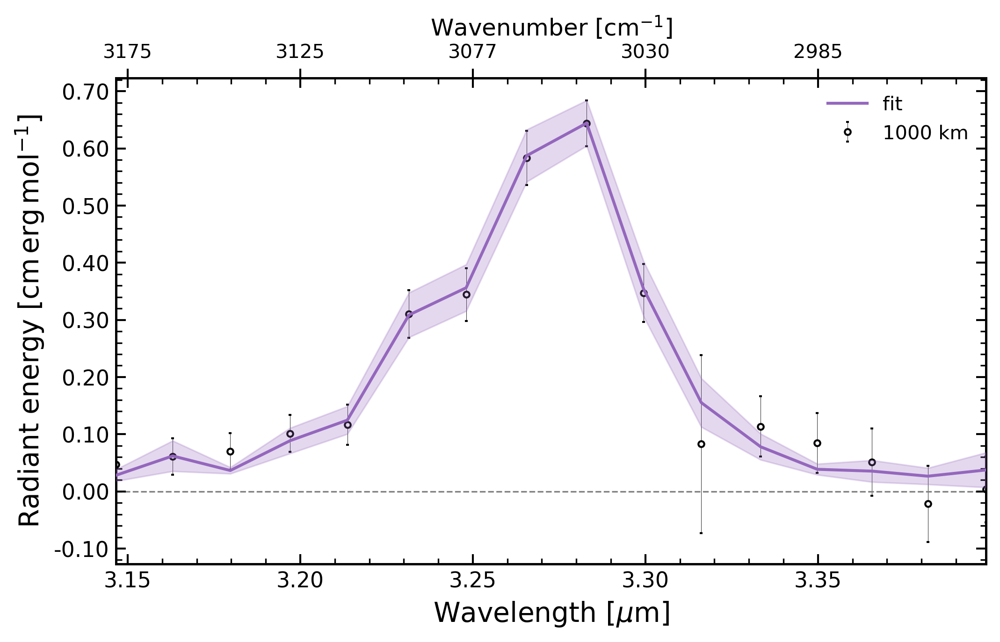

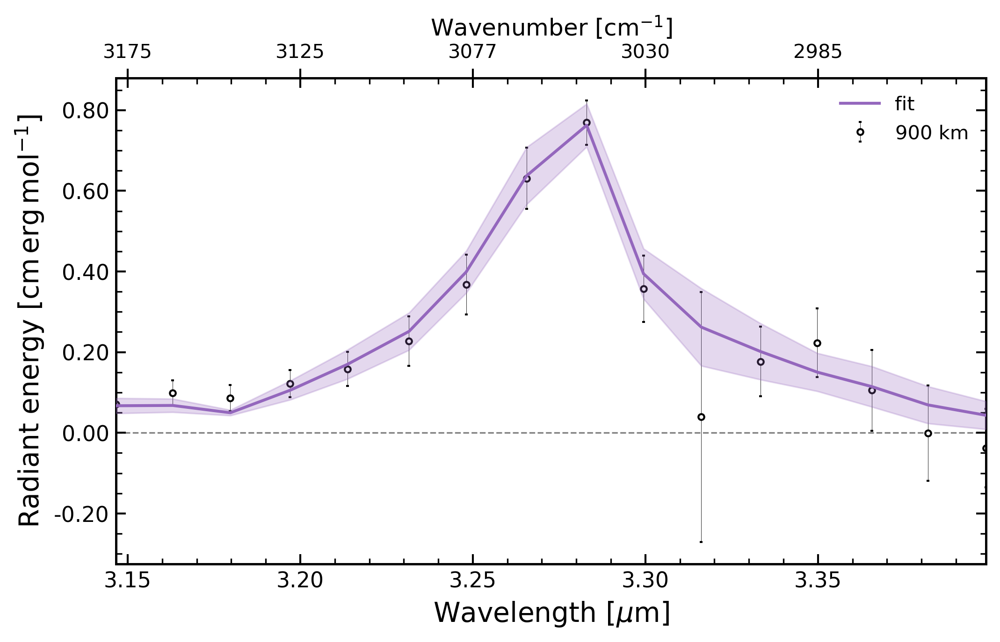

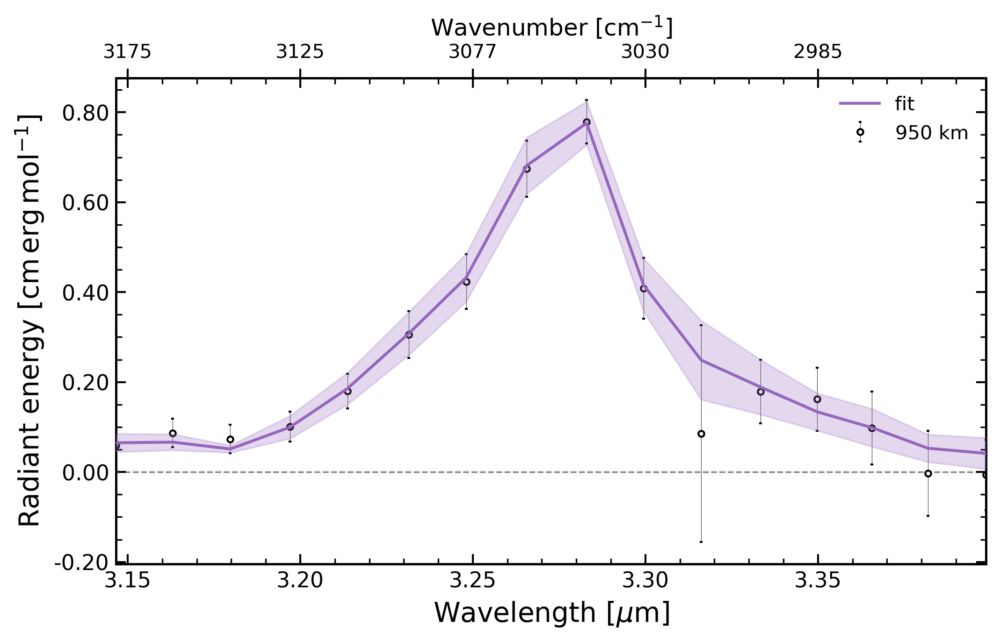

...

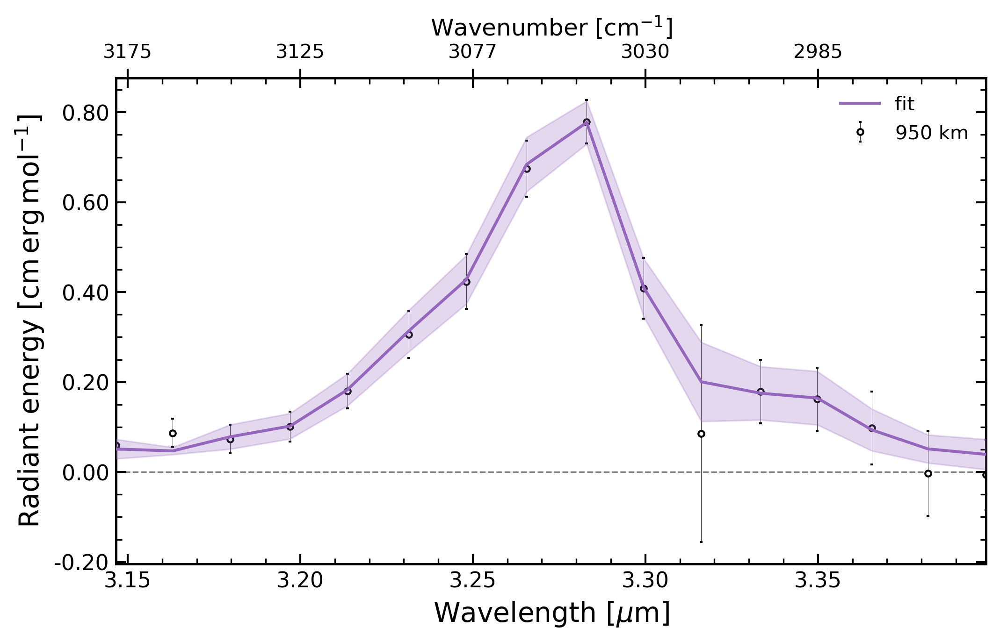

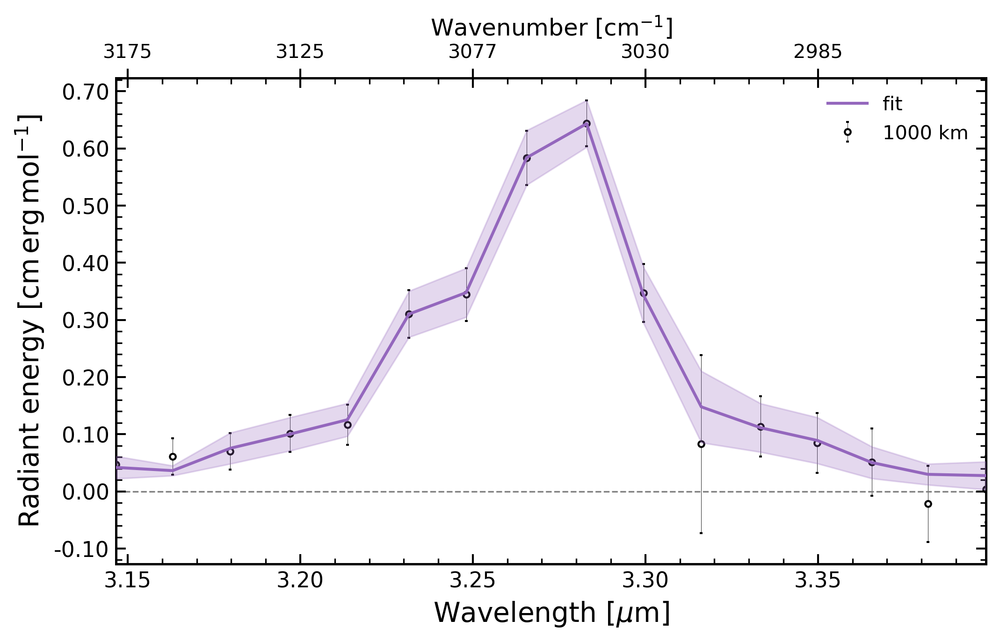

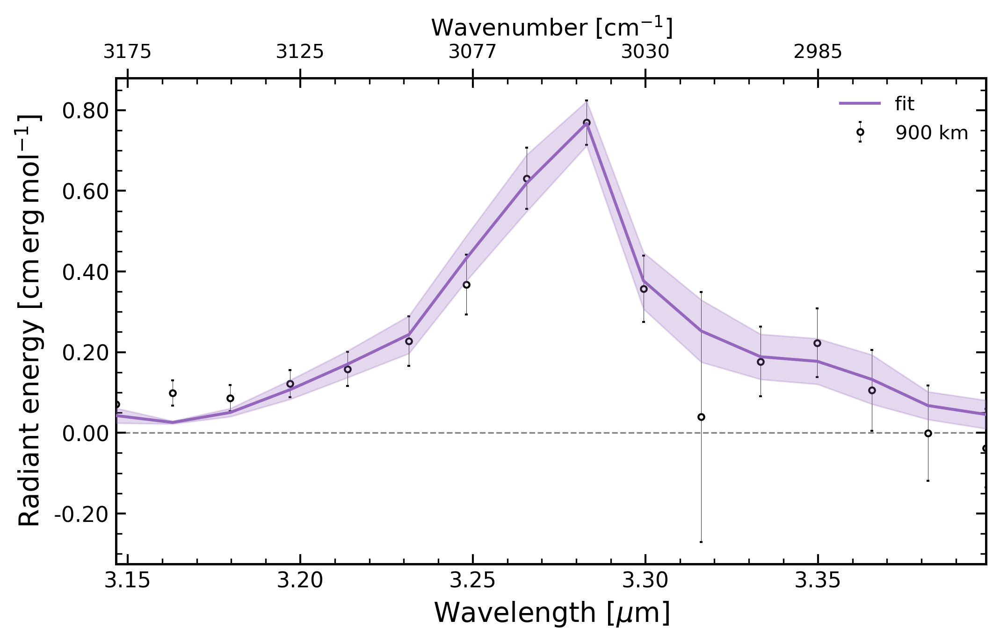

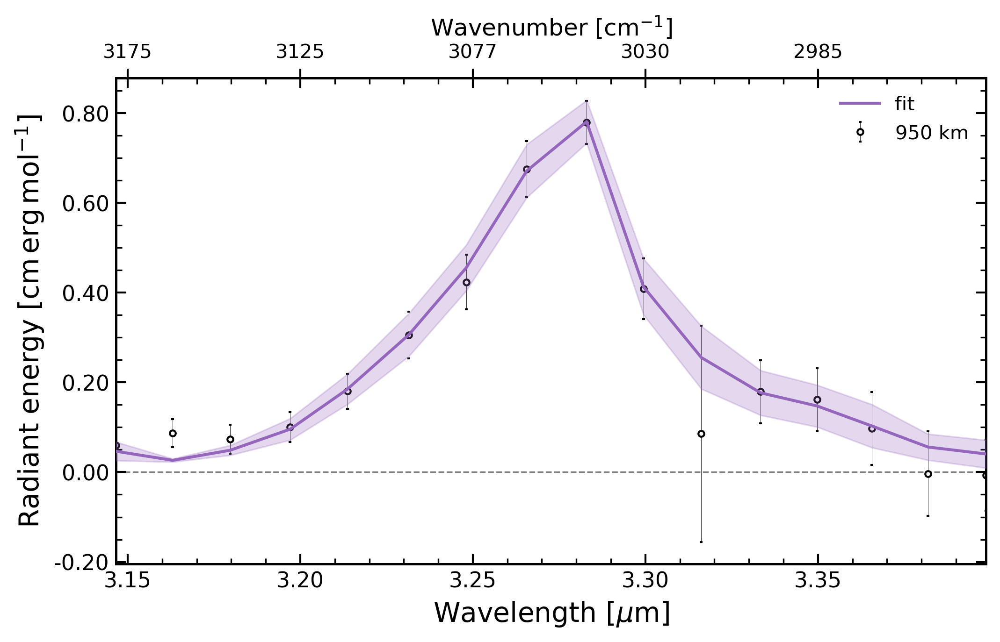

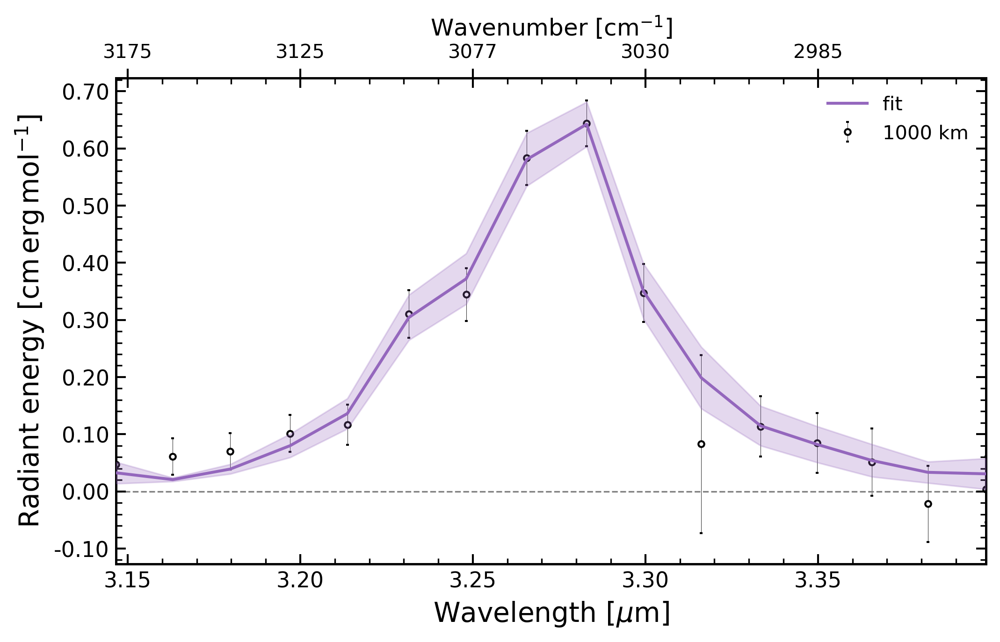

In [14]:
# Plotting mcfit results
for spec_label, obs_mcfits in mcfits.items():
    for obs_label, mcfit in obs_mcfits.items():
        print(f"Plotting mcfit for {spec_label} at {obs_label} km")
        # Ensure the directory exists
        output_path = os.path.join(output_dir, f"mcfit_{spec_label}_{obs_label}")
        # Plot the mcfit results
        mcfit.plot(wavelength=True, residual=True, datalabel=f'{obs_label} km', save=True, output=output_path, ftype="pdf")

In [15]:
# Dictionary to store .get() results
mcfit_results = {}

for spec_label, obs_mcfits in mcfits.items():
    mcfit_results[spec_label] = {}
    for obs_label, mcfit in obs_mcfits.items():
        result = mcfit.get()
        mcfit_results[spec_label][obs_label] = result

mcfit_results_gaussian = {}
for spec_label, obs_mcfits in mcfits_gaussian.items():
    mcfit_results_gaussian[spec_label] = {}
    for obs_label, mcfit in obs_mcfits.items():
        result = mcfit.get()
        mcfit_results_gaussian[spec_label][obs_label] = result


In [16]:
# Example of accessing a specific result
mcfit_results['v1.20_neutral']['900']['mcfits'][0]

{'uids': [493, 527, 339, 378, 357, 105, 143],
 'weights': {493: np.float64(2.762470415859999e+32),
  527: np.float64(1.6544808706715768e+33),
  339: np.float64(6.092001234769407e+32),
  378: np.float64(1.7623769405577322e+32),
  357: np.float64(1.566660916790728e+33),
  105: np.float64(2.6023823798151572e+32),
  143: np.float64(2.9426548173033664e+33)},
 'rchi2': np.float64(1.9279766565025556)}

Height: 900 km, min UID counts: 4, max UID counts: 12
Height: 950 km, min UID counts: 5, max UID counts: 14
Height: 1000 km, min UID counts: 5, max UID counts: 13
minimum uid count: 5 and maximum uid count: 13


/var/folders/vv/2nq91_0d0lsfm6gcskyz__r40000gn/T/ipykernel_4598/1775556943.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("YlGnBu")


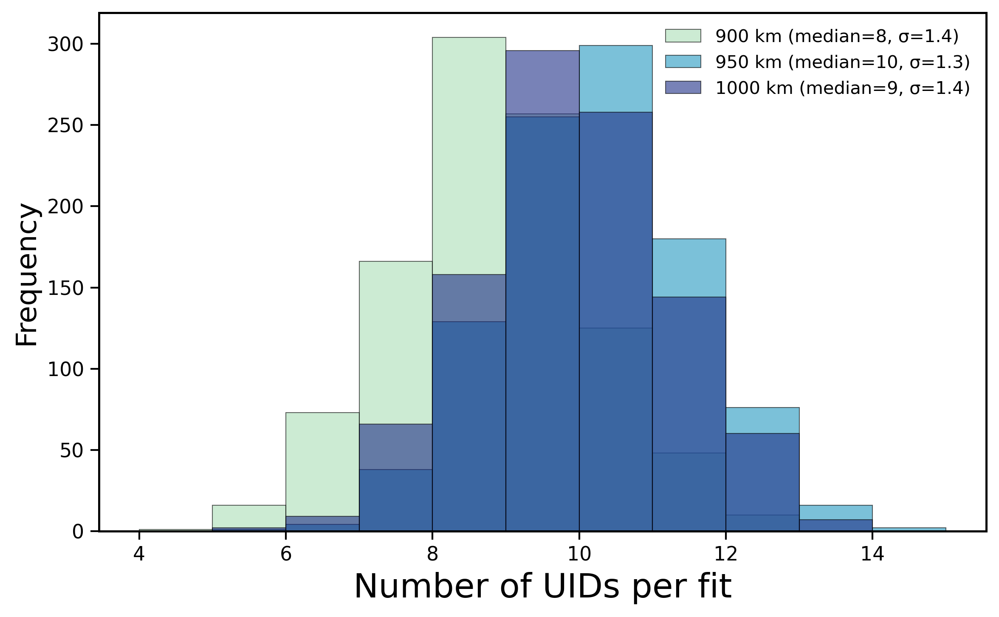

In [18]:
# Define the heights and colors
heights = ['900', '950', '1000']
cmap = get_cmap("YlGnBu")
colors = {900: cmap(0.3), 950: cmap(0.6), 1000: cmap(0.9)}

# Create the plot
plt.figure(figsize=(8, 5), dpi=300)

for height in heights:
    fits = mcfit_results['v3.20_neutral_anion'][height]['mcfits']
    uid_counts = [len(fit['uids']) for fit in fits]
    print(f"Height: {height} km, min UID counts: {min(uid_counts)}, max UID counts: {max(uid_counts)}")

    # Compute stats
    median = np.median(uid_counts)
    std = np.std(uid_counts)

    # Plot histogram
    plt.hist(uid_counts,
             bins=range(min(uid_counts), max(uid_counts)+2),
             alpha=0.6,
             label=f'{height} km (median={median:.0f}, σ={std:.1f})',
             color=colors[int(height)],
             edgecolor='black',
             linewidth=0.5)

# Add labels and formatting
plt.xlabel("Number of UIDs per fit", fontsize=19)
plt.ylabel("Frequency", fontsize=16)
# plt.title("UID Count Distribution per Monte Carlo Fit\n(v3.20_neutral_anion)", fontsize=14)
plt.legend(fontsize=10, loc='upper right')
plt.tight_layout()
print("minimum uid count:", min(uid_counts), "and maximum uid count:", max(uid_counts))
plt.show()


# Making Plots for Thesis!

## Violin Plots

Plotting GOF for v1.20_neutral


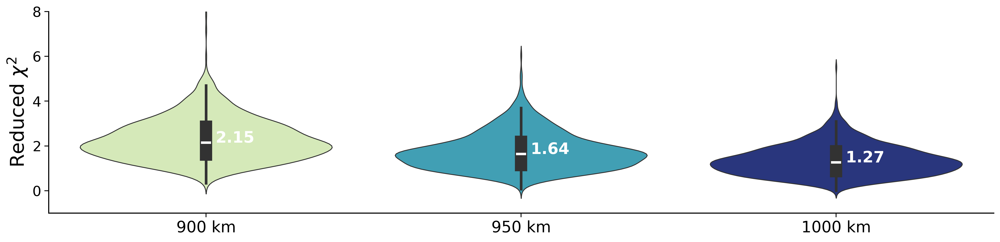

{'Mean reduced χ²': np.float64(1.805), 'Median reduced χ²': np.float64(1.666), 'Standard Deviation': np.float64(0.904)}
Plotting GOF for v3.20_neutral_anion


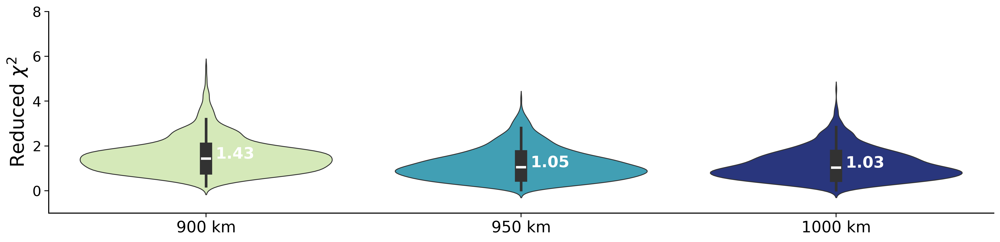

{'Mean reduced χ²': np.float64(1.294), 'Median reduced χ²': np.float64(1.174), 'Standard Deviation': np.float64(0.722)}
Plotting GOF for v3.20_small_neutral_anion


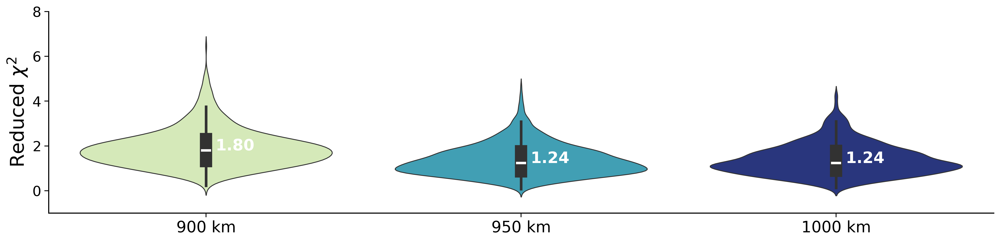

{'Mean reduced χ²': np.float64(1.556), 'Median reduced χ²': np.float64(1.426), 'Standard Deviation': np.float64(0.789)}
Plotting GOF for v4.00_neutral_anion


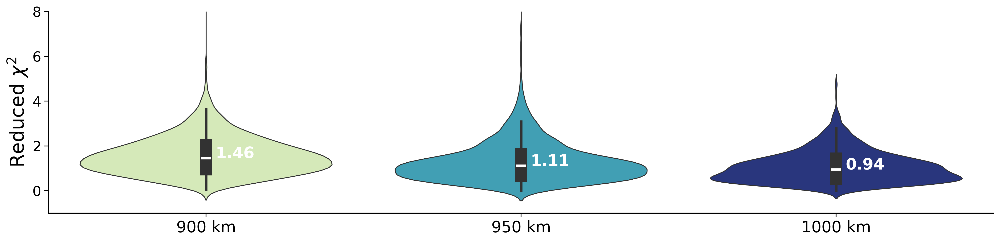

/Users/floorstikkelbroeck/anaconda3/envs/titanpahs/lib/python3.11/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


{'Mean reduced χ²': np.float64(inf), 'Median reduced χ²': np.float64(1.156), 'Standard Deviation': np.float64(nan)}
Plotting GOF for v4.00_small_neutral_anion


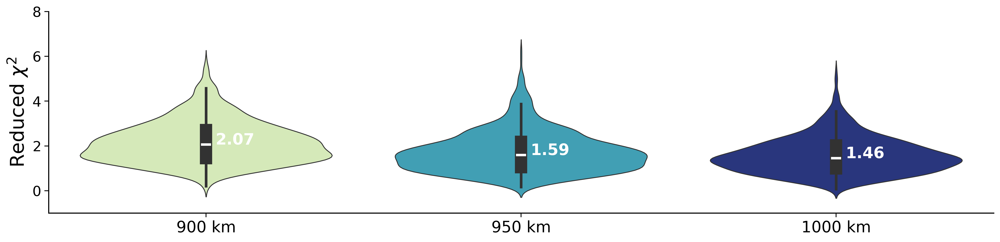

{'Mean reduced χ²': np.float64(1.824), 'Median reduced χ²': np.float64(1.675), 'Standard Deviation': np.float64(0.923)}


In [20]:
# Loop over all versions
for version, selected_mcfits in mcfit_results.items():
    print(f"Plotting GOF for {version}")
    # Collect rchi2 values and height labels
    gof_values = []
    height_labels = []

    for height, mcfit in selected_mcfits.items():
        for sample in mcfit['mcfits']:
            gof_values.append(sample['rchi2'])
            height_labels.append(height)

    # Create DataFrame
    df_gof = pd.DataFrame({
        'Monte Carlo Run': range(1, len(gof_values) + 1),
        'GOF': gof_values,
        'Height': height_labels
    })

    # Plot
    fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
    heights_sorted = sorted(df_gof["Height"].unique(), key=int)
    colors_sorted = [height_colors[h] for h in heights_sorted]
    
    sns.violinplot(x="Height", y="GOF", hue="Height", data=df_gof,
                palette=height_colors, ax=ax, legend=False,
                inner="box", inner_kws={"box_width": 14, "whis_width": 3}, saturation=0.8, fill=True)

    # Annotate medians
    heights_sorted = sorted(df_gof["Height"].unique(), key=int)
    medians = df_gof.groupby("Height")["GOF"].median()

    for i, height in enumerate(heights_sorted):
        median = medians[height]
        ax.text(i + 0.03, median, f"{median:.2f}", ha='left', fontsize=18,
                color='white', fontweight='bold')

    # Format axis
    ax.set_xticks(range(len(heights_sorted)))
    ax.set_xticklabels([f"{h} km" for h in heights_sorted])
    ax.set_ylabel(r"Reduced $\chi^2$", fontsize=22)
    ax.set_xlabel("")
    ax.set_ylim(-1, 8)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=16)
    # ax.set_title(version.replace("_", " "), fontsize=20)
    sns.despine(ax=ax)
    plt.tight_layout()
    plt.show()
    # Summary statistics
    gof_summary = {
        "Mean reduced χ²": round(np.mean(gof_values),3),
        "Median reduced χ²": round(np.median(gof_values),3),
        "Standard Deviation": round(np.std(gof_values),3)
    }
    print(gof_summary)



Plotting GOF for v1.20_neutral


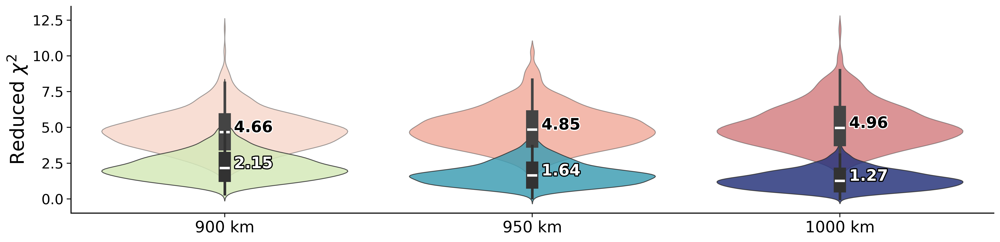

{'Mean reduced χ²': np.float64(1.805), 'Median reduced χ²': np.float64(1.666), 'Standard Deviation': np.float64(0.904)}
Plotting GOF for v3.20_neutral_anion


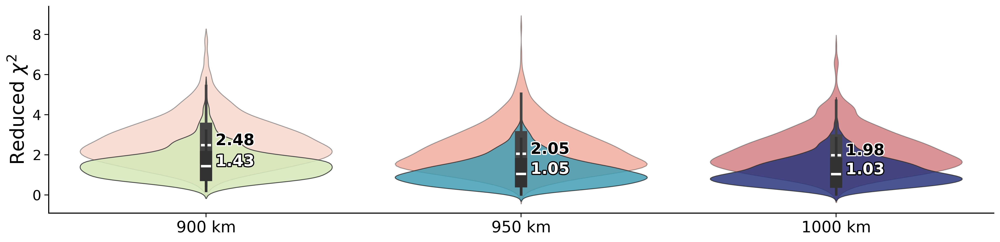

{'Mean reduced χ²': np.float64(1.294), 'Median reduced χ²': np.float64(1.174), 'Standard Deviation': np.float64(0.722)}
Plotting GOF for v3.20_small_neutral_anion


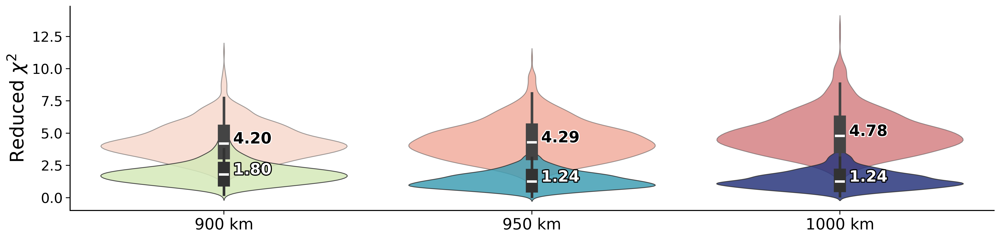

{'Mean reduced χ²': np.float64(1.556), 'Median reduced χ²': np.float64(1.426), 'Standard Deviation': np.float64(0.789)}
Plotting GOF for v4.00_neutral_anion


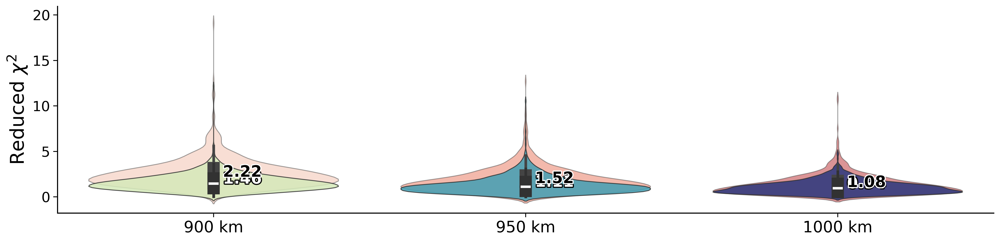

/Users/floorstikkelbroeck/anaconda3/envs/titanpahs/lib/python3.11/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


{'Mean reduced χ²': np.float64(inf), 'Median reduced χ²': np.float64(1.156), 'Standard Deviation': np.float64(nan)}
Plotting GOF for v4.00_small_neutral_anion


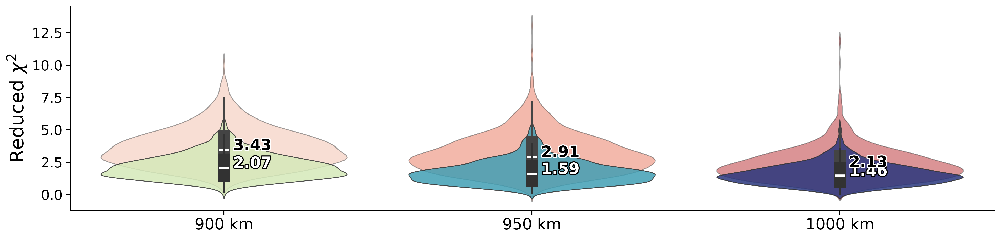

{'Mean reduced χ²': np.float64(1.824), 'Median reduced χ²': np.float64(1.675), 'Standard Deviation': np.float64(0.923)}


In [21]:
# Loop over all versions
for version, selected_mcfits in mcfit_results.items():
    print(f"Plotting GOF for {version}")
    # Get the corresponding gaussian results
    selected_mcfits_gaussian = mcfit_results_gaussian[version]

    gof_values = []
    height_labels = []
    gof_values_gaussian = []
    height_labels_gaussian = []

    for height, mcfit in selected_mcfits.items():
        for sample in mcfit['mcfits']:
            gof_values.append(sample['rchi2'])
            height_labels.append(height)

    for height, mcfit in selected_mcfits_gaussian.items():  # FIXED
        for sample in mcfit['mcfits']:
            gof_values_gaussian.append(sample['rchi2'])
            height_labels_gaussian.append(height)

    # Create DataFrame
    df_gof = pd.DataFrame({
        'Monte Carlo Run': range(1, len(gof_values) + 1),
        'GOF': gof_values,
        'Height': height_labels
    })
    df_gof_gaussian = pd.DataFrame({
        'Monte Carlo Run': range(1, len(gof_values_gaussian) + 1),
        'GOF': gof_values_gaussian,
        'Height': height_labels_gaussian
    })

    # Plot
    fig, ax = plt.subplots(figsize=(16, 4), dpi=300)
    heights_sorted = sorted(df_gof["Height"].unique(), key=int)
    colors_sorted = [height_colors[h] for h in heights_sorted]

    sns.violinplot(x="Height", y="GOF", hue="Height", data=df_gof_gaussian,
            palette='Reds', ax=ax, legend=False,
            inner="box", inner_kws={"box_width": 14, "whis_width": 3}, saturation=0.8, fill=True, alpha=0.5)
    
    sns.violinplot(x="Height", y="GOF", hue="Height", data=df_gof,
                palette=height_colors, ax=ax, legend=False,
                inner="box", inner_kws={"box_width": 14, "whis_width": 3}, saturation=0.8, fill=True, alpha=0.85)


    # Annotate medians
    heights_sorted = sorted(df_gof["Height"].unique(), key=int)
    medians = df_gof.groupby("Height")["GOF"].median()

    for i, height in enumerate(heights_sorted):
        median = medians[height]
        txt = ax.text(i + 0.03, median, f"{median:.2f}", ha='left', fontsize=18,
                    color='white', fontweight='bold')
        txt.set_path_effects([
            path_effects.Stroke(linewidth=2.5, foreground='black'),
            path_effects.Normal()
        ])
        
    heights_sorted_gaussian = sorted(df_gof_gaussian["Height"].unique(), key=int)
    medians_gaussian = df_gof_gaussian.groupby("Height")["GOF"].median()

    # v1.20 (greyscale, black text with white outline)
    for i, height in enumerate(heights_sorted_gaussian):
        median = medians_gaussian[height]
        txt = ax.text(i + 0.03, median, f"{median:.2f}", ha='left', fontsize=18,
                    color='black', fontweight='bold')
        txt.set_path_effects([
            path_effects.Stroke(linewidth=2.5, foreground='white'),
            path_effects.Normal()
        ])

    # Format axis
    ax.set_xticks(range(len(heights_sorted)))
    ax.set_xticklabels([f"{h} km" for h in heights_sorted])
    ax.set_ylabel(r"Reduced $\chi^2$", fontsize=22)
    ax.set_xlabel("")
    # ax.set_ylim(-1, 8)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=16)
    # ax.set_title(version.replace("_", " "), fontsize=20)
    sns.despine(ax=ax)
    plt.tight_layout()
    plt.savefig(f"GOF_Comparison_Gaussian_{version}.pdf", format="pdf", bbox_inches="tight")
    plt.show()
    # Summary statistics
    gof_summary = {
        "Mean reduced χ²": round(np.mean(gof_values),3),
        "Median reduced χ²": round(np.median(gof_values),3),
        "Standard Deviation": round(np.std(gof_values),3)
    }
    print(gof_summary)



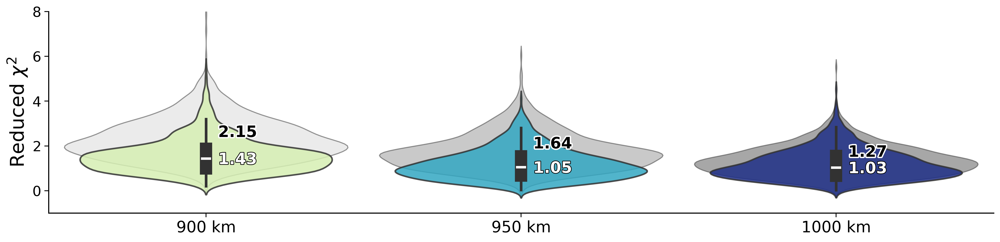

In [22]:
# Combined violinplot of v1.20 and v3.20 for GOF comparison

from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd

# Prepare lists for both versions
version_1 = "v1.20_neutral"
version_2 = "v3.20_neutral_anion"

# Collect GOF values
records = []
for version in [version_1, version_2]:
    for height, mcfit in mcfit_results[version].items():
        for sample in mcfit["mcfits"]:
            records.append({
                "GOF": sample["rchi2"],
                "Height": str(height),
                "Version": version
            })

df_combined = pd.DataFrame(records)

# Sort heights numerically for consistent x-axis
height_order = sorted(df_combined["Height"].unique(), key=int)

# Combined violinplot of v1.20 and v3.20 GOF values with custom styling
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)

version_1 = "v1.20_neutral"
version_2 = "v3.20_neutral_anion"

# Collect all GOF values into a combined dataframe
records_v1 = []
records_v2 = []

for height, mcfit in mcfit_results[version_1].items():
    for sample in mcfit["mcfits"]:
        records_v1.append({
            "GOF": sample["rchi2"],
            "Height": str(height),
            "Version": "v1.20"
        })

for height, mcfit in mcfit_results[version_2].items():
    for sample in mcfit["mcfits"]:
        records_v2.append({
            "GOF": sample["rchi2"],
            "Height": str(height),
            "Version": "v3.20"
        })

df_v1 = pd.DataFrame(records_v1)
df_v2 = pd.DataFrame(records_v2)
heights_sorted = sorted(df_v1["Height"].unique(), key=int)

# Calculate medians for each height
medians_v1 = df_v1.groupby("Height")["GOF"].median()
medians_v2 = df_v2.groupby("Height")["GOF"].median()

# Plot v1.20 in Greyscale
sns.violinplot(
    data=df_v1, x="Height", y="GOF", hue="Height",
    palette="Greys", ax=ax, legend=False, fill=True,
    inner=None,
    linewidth=1.2, saturation=0.5, alpha=0.5, width=0.9
)

# Plot v3.20 in Color
sns.violinplot(
    data=df_v2, x="Height", y="GOF", hue="Height",
    palette=height_colors, ax=ax, legend=False, fill=True,
    inner="box", inner_kws={"box_width": 14, "whis_width": 3},
    linewidth=1.8, saturation=1.0, alpha=0.85, width=0.8
)

for i, height in enumerate(heights_sorted):
    median1 = medians_v1[height]
    median2 = medians_v2[height]

    # Dark label (v1.20) – place slightly above
    ax.text(i + 0.1, median1 + 0.25, f"{median1:.2f}",
            ha='center', fontsize=18, color='black', fontweight='bold',
            path_effects=[pe.withStroke(linewidth=3, foreground="white")])

    # Light label (v3.20) – place slightly below
    ax.text(i + 0.1, median2 - 0.25, f"{median2:.2f}",
            ha='center', fontsize=18, color='white', fontweight='bold',
            path_effects=[pe.withStroke(linewidth=1.5, foreground="black")])


# Formatting
ax.set_xticks(range(len(heights_sorted)))
ax.set_xticklabels([f"{h} km" for h in heights_sorted])
ax.set_ylabel(r"Reduced $\chi^2$", fontsize=22)
ax.set_xlabel("")
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=16)
ax.set_ylim(-1, 8)
# ax.legend
sns.despine(ax=ax)
plt.tight_layout()
plt.savefig("GOF_Comparison_v1.20_v3.20.pdf", format="pdf", bbox_inches="tight")
plt.show()


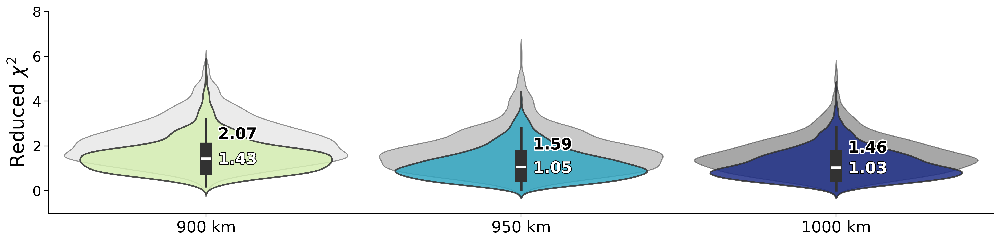

In [ ]:
# Prepare lists for both versions
version_1 = "v4.00_small_neutral_anion"
version_2 = "v3.20_neutral_anion"

# Collect GOF values
records = []
for version in [version_1, version_2]:
    for height, mcfit in mcfit_results[version].items():
        for sample in mcfit["mcfits"]:
            records.append({
                "GOF": sample["rchi2"],
                "Height": str(height),
                "Version": version
            })

df_combined = pd.DataFrame(records)

# Sort heights numerically for consistent x-axis
height_order = sorted(df_combined["Height"].unique(), key=int)

# Combined violinplot of v1.20 and v3.20 GOF values with custom styling
fig, ax = plt.subplots(figsize=(16, 4), dpi=300)

version_1 = "v4.00_neutral_anion"
version_2 = "v3.20_neutral_anion"

# Collect all GOF values into a combined dataframe
records_v1 = []
records_v2 = []

for height, mcfit in mcfit_results[version_1].items():
    for sample in mcfit["mcfits"]:
        records_v1.append({
            "GOF": sample["rchi2"],
            "Height": str(height),
            "Version": "v4.00"
        })

for height, mcfit in mcfit_results[version_2].items():
    for sample in mcfit["mcfits"]:
        records_v2.append({
            "GOF": sample["rchi2"],
            "Height": str(height),
            "Version": "v3.20"
        })

df_v1 = pd.DataFrame(records_v1)
df_v2 = pd.DataFrame(records_v2)
heights_sorted = sorted(df_v1["Height"].unique(), key=int)

# Calculate medians for each height
medians_v1 = df_v1.groupby("Height")["GOF"].median()
medians_v2 = df_v2.groupby("Height")["GOF"].median()

# Plot v1.20 in Greyscale
sns.violinplot(
    data=df_v1, x="Height", y="GOF", hue="Height",
    palette="Greys", ax=ax, legend=False, fill=True,
    inner=None,
    linewidth=1.2, saturation=0.5, alpha=0.5, width=0.9
)

# Plot v3.20 in Color
sns.violinplot(
    data=df_v2, x="Height", y="GOF", hue="Height",
    palette=height_colors, ax=ax, legend=False, fill=True,
    inner="box", inner_kws={"box_width": 14, "whis_width": 3},
    linewidth=1.8, saturation=1.0, alpha=0.85, width=0.8
)

for i, height in enumerate(heights_sorted):
    median1 = medians_v1[height]
    median2 = medians_v2[height]

    # Dark label (v1.20) – place slightly above
    ax.text(i + 0.1, median1 + 0.25, f"{median1:.2f}",
            ha='center', fontsize=18, color='black', fontweight='bold',
            path_effects=[pe.withStroke(linewidth=3, foreground="white")])

    # Light label (v3.20) – place slightly below
    ax.text(i + 0.1, median2 - 0.25, f"{median2:.2f}",
            ha='center', fontsize=18, color='white', fontweight='bold',
            path_effects=[pe.withStroke(linewidth=1.5, foreground="black")])


# Formatting
ax.set_xticks(range(len(heights_sorted)))
ax.set_xticklabels([f"{h} km" for h in heights_sorted])
ax.set_ylabel(r"Reduced $\chi^2$", fontsize=22)
ax.set_xlabel("")
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=16)
ax.set_ylim(-1, 8)
# ax.legend
sns.despine(ax=ax)
plt.tight_layout()
plt.savefig("output/GOF_Comparison_v4.00_neutral_anion_v3.20.pdf", format="pdf", bbox_inches="tight")
plt.show()


In [24]:
#asses the very best rchi2 values
rchi2_count = 0
for i in range(len(mcfit_results['v3.20_neutral_anion']['900']['mcfits'])):
    rchi2 = mcfit_results['v3.20_neutral_anion']['900']['mcfits'][i]['rchi2']
 
    # Count how many times rchi2 is within the range
    if 0.99 < rchi2 < 1.01:
        print(f"Sample {i+1} rchi2: {rchi2}")
        print(mcfit_results['v3.20_neutral_anion']['900']['mcfits'][i])
        rchi2_count += 1
print(f"Total samples with rchi2 between 0.99 and 1.01: {rchi2_count}")


Sample 41 rchi2: 0.9985236534898736
{'uids': [527, 519, 105, 4082, 4088, 384, 4014, 701], 'weights': {527: np.float64(0.2949906539770831), 519: np.float64(0.0917843383042453), 105: np.float64(0.03804268524741857), 4082: np.float64(0.10910387846979894), 4088: np.float64(0.013251735197801961), 384: np.float64(0.05558318751639825), 4014: np.float64(0.11336952355041387), 701: np.float64(0.29573461247586075)}, 'rchi2': np.float64(0.9985236534898736)}
Sample 396 rchi2: 1.0063867346448205
{'uids': [527, 159, 3741, 3317, 382, 4014, 170], 'weights': {527: np.float64(0.23259713038912244), 159: np.float64(0.38202583169142756), 3741: np.float64(0.0812484968863344), 3317: np.float64(0.08732110129026763), 382: np.float64(0.07700634528984764), 4014: np.float64(0.08370295389405438), 170: np.float64(0.13129542111346376)}, 'rchi2': np.float64(1.0063867346448205)}
Sample 451 rchi2: 1.0086767537390458
{'uids': [527, 465, 159, 3976, 3327, 382, 3832, 188], 'weights': {527: np.float64(0.30367315004805623), 4

In [25]:
pahdb_v3.getspeciesbyuid([527]).get()['data'][527]['formula'] #.get()['data'])

'C10H8N'

## Frequency Histograms

In [26]:
def plot_relative_contributions_histogram(
    mcfit_results, spec_label, pahdb,
    heights=(900, 950, 1000),
    min_total_contribution=0.01
):

    # Step 1: collect all relative weights per UID across samples
    uid_weights_total = {h: defaultdict(float) for h in heights}

    for height in heights:
        fits = mcfit_results[spec_label][str(height)]['mcfits']
        for fit in fits:
            weights = fit["weights"]
            total = sum(weights.values())
            if total == 0:
                continue
            for uid, w in weights.items():
                uid_weights_total[height][uid] += w / total  # relative contribution per run

    # Step 2: normalize to get average per height
    uid_rel_avg = {h: {} for h in heights}
    for height in heights:
        N = len(mcfit_results[spec_label][str(height)]['mcfits'])
        uid_rel_avg[height] = {uid: val / N for uid, val in uid_weights_total[height].items()}

    # Step 3: compute total contribution over all heights and filter
    total_contributions = defaultdict(float)
    for height in heights:
        for uid, rel in uid_rel_avg[height].items():
            total_contributions[uid] += rel

    uids_to_keep = {uid for uid, tot in total_contributions.items() if tot >= min_total_contribution}

    # Extract all UIDs we care about
    all_uids = list(uids_to_keep)
    species_data = pahdb.getspeciesbyuid(all_uids).get()['data']

    # Map UID → formula
    uid_to_formula = {}
    for uid in all_uids:
        uid_to_formula[uid] = species_data[uid]["formula"]


    # Step 4: create DataFrame
    rows = []
    for height in heights:
        for uid, rel in uid_rel_avg[height].items():
            if uid in uids_to_keep:
                rows.append({"UID": str(uid), "Height": int(height), "MeanRel": rel})

    df = pd.DataFrame(rows)
    df["Height"] = df["Height"].astype(str) + " km"
    df["UID"] = df["UID"].astype(int)  # convert to int for sorting

    uid_to_carbon = {uid: extract_carbon_count(f) for uid, f in uid_to_formula.items()}
    df["Carbon"] = df["UID"].astype(int).map(uid_to_carbon)

    # Sort by carbon count
    df = df.sort_values("Carbon")
    df["UID"] = df["UID"].astype(str)  # make sure labels remain strings
 # convert back to string for x-tick labels

    # Total over heights for ranking
    uid_totals_df = df.groupby("UID")["MeanRel"].sum().sort_values(ascending=False)
    top_uids = set(uid_totals_df.head(5).index)

    heights_km = [f"{h} km" for h in heights]
    palette_km = {f"{h} km": height_colors[str(h)] for h in heights}


    # Step 5: Plot
    print(f"Plotting relative contributions for {spec_label}")
    plt.figure(figsize=(16, 6), dpi=300)
    uids_ordered = df.drop_duplicates("UID")["UID"].tolist()
    n = len(uids_ordered)
    ax = sns.barplot(
        data=df,
        x="UID",
        y="MeanRel",
        hue="Height",
        palette=palette_km,
        order=uids_ordered,
        hue_order=heights_km  # ensures 900, 950, 1000 order
    )

    annotated = set()
    label_positions = []

    for container in ax.containers:
        for bar in container:
            uid_center = bar.get_x() + bar.get_width() / 2
            x_idx = int(round(uid_center))

            try:
                uid_str = uids_ordered[x_idx]
            except IndexError:
                continue  # just in case

            if uid_str not in top_uids or uid_str in annotated:
                continue

            annotated.add(uid_str)
            y_base = bar.get_height()
            x = bar.get_x() + bar.get_width() / 2
            formula = uid_to_formula.get(int(uid_str), "")
            formatted_formula = format_formula(formula)

            # Default positions
            label_y = y_base + 0.12
            arrow_y = y_base + 0.015

            if y_base < 0.03:
                label_y += 0.02
                arrow_y += 0.01


            for existing_x, existing_y in label_positions:
                if abs(existing_x - x) < 1.5 and abs(existing_y - label_y) < 0.05:
                    label_y = existing_y + 0.05  # bump upward


            label_positions.append((x, label_y))

            # Plot label
            ax.text(
                x, label_y, formatted_formula,
                ha="center", va="bottom",
                fontsize=18, fontweight="bold", color="black",
                path_effects=[
                    pe.withStroke(linewidth=3, foreground='white')
                ]
            )

            # Plot arrow
            ax.annotate(
                '', xy=(x, arrow_y), xytext=(x, label_y - 0.015),
                arrowprops=dict(
                    arrowstyle='-|>',
                    color='black',
                    lw=2.5,
                    alpha=0.95,
                    shrinkA=0, shrinkB=0,
                    mutation_scale=18
                ),
                annotation_clip=False
            )

    plt.ylabel("Mean Relative Contribution", fontsize=18)
    plt.xlabel("PAH UID", fontsize=18)
    plt.yticks(fontsize=16)
    plt.xticks(rotation=45, fontsize=16)
    plt.legend(
        fontsize=14,
        frameon=False
    )


    ax.set_xlim(-1.5, n + 0.5)  # gives some padding on both sides
    max_y = df["MeanRel"].max()
    ax.set_ylim(0, max_y + 0.12)

    # ax.set_ylim(0, 0.40)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"relative_contributions_{spec_label}.pdf"), format="pdf", dpi=300, bbox_inches="tight", pad_inches=0.1)
    plt.show()

    return


Plotting relative contributions for v1.20_neutral


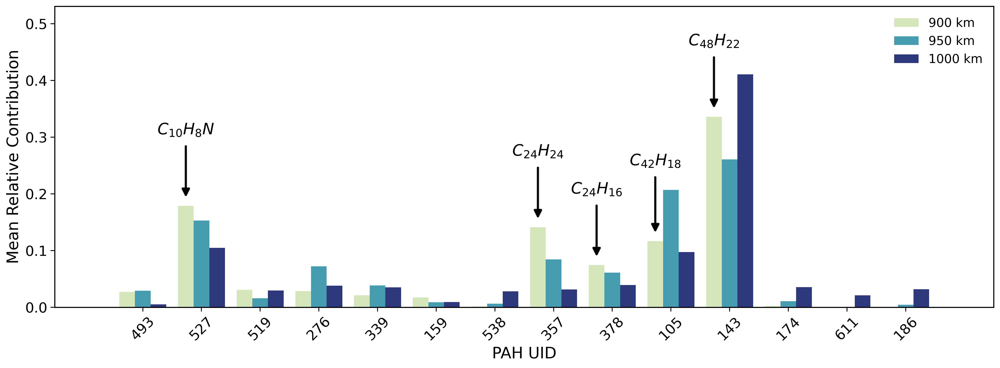

Plotting relative contributions for v3.20_neutral_anion


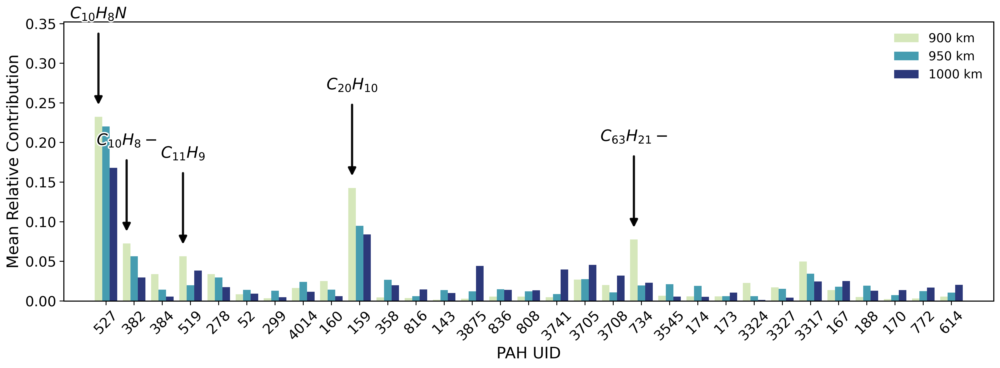

Plotting relative contributions for v3.20_small_neutral_anion


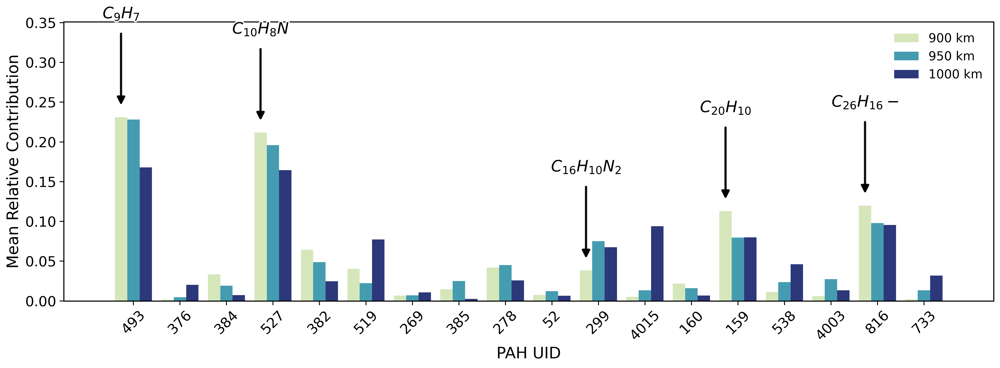

Plotting relative contributions for v4.00_neutral_anion


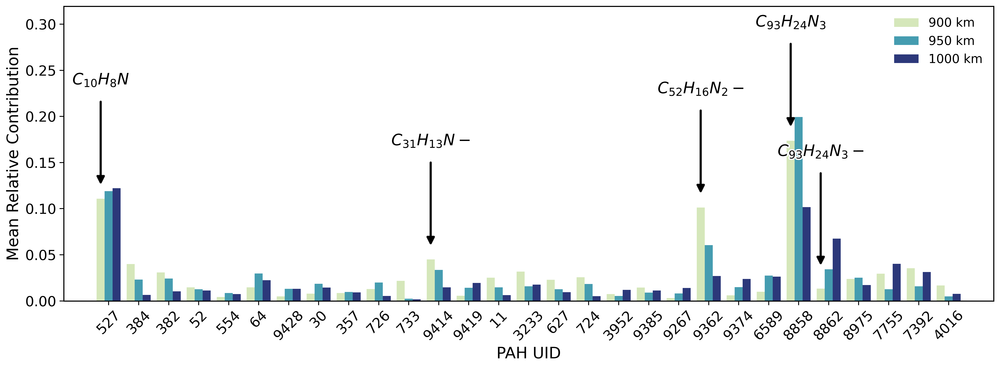

Plotting relative contributions for v4.00_small_neutral_anion


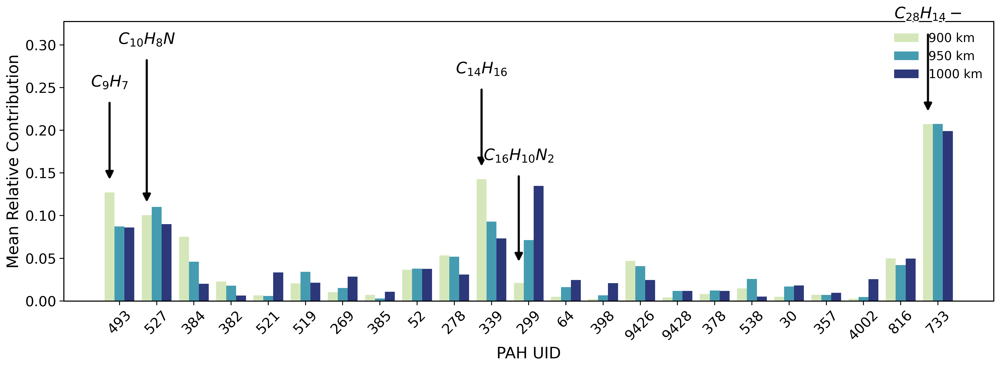

In [27]:
for spec_label in trans_pickles:
    if spec_label in mcfit_results:
        _, pahdb_obj = trans_pickles[spec_label]  # Get the corresponding PAHdb object
        plot_relative_contributions_histogram(
            mcfit_results=mcfit_results,
            spec_label=spec_label,
            pahdb=pahdb_obj,
            heights=(900, 950, 1000),
            min_total_contribution=0.02
        )


In [54]:
#can you make me an organized list of what UID goes with what molecular formula

# Create a mapping of UID to molecular formula
uid_to_formula = {}

# Get all UIDs from the database


search_query1 = "mg=0 fe=0 si=0 o=0 h>0 neutral"  # Only cationic PAHs
search_query2 = "mg=0 fe=0 si=0 o=0 h>0 anion"  # Only cationic PAHs
# # Perform the search
uids1 = pahdb_v4.search(search_query1)
uids2 = pahdb_v4.search(search_query2)
uids = uids1 + uids2

species_data = pahdb_v4.getspeciesbyuid(uids).get()['data']

# Populate the mapping with LaTeX formatted formulas
def formula_to_latex(formula):
    # Replace numbers with _{number} for subscripts
    return re.sub(r'([A-Za-z])(\d+)', r'\1$_{\2}$', formula)


for uid, data in species_data.items():
    formula = data.get("formula")
    if formula:
        uid_to_formula[uid] = formula_to_latex(formula)

#put it in a pandas DataFrame
uid_formula_df = pd.DataFrame(list(uid_to_formula.items()), columns=['UID', 'Molecular Formula'])
uid_formula_df['UID'] = uid_formula_df['UID'].astype(int)  # Convert UID to integer for better readability
uid_formula_df = uid_formula_df.sort_values(by='UID')
uid_formula_df.reset_index(drop=True, inplace=True)
#export to csv
uid_formula_df.to_csv(os.path.join(output_dir, 'uid_molecular_formula_mapping.csv'), index=False)


### Combining tables to make comparison plot

In [40]:
#from v3.20_neutral_anion combine all the results from 900, 950, 1000 together
def combine_mcfit_results(mcfit_results, spec_label, heights=(900, 950, 1000)):
    combined_results = defaultdict(list)
    
    for height in heights:
        if spec_label in mcfit_results and str(height) in mcfit_results[spec_label]:
            mcfits = mcfit_results[spec_label][str(height)]['mcfits']
            combined_results[str(height)].extend(mcfits)

    # calculate the relative concentrations of the top 20 most contributing PAHs combined across all heights
    uid_weights_total = defaultdict(float)
    fit_count = 0

    for height, mcfits in combined_results.items():
        for fit in mcfits:
            weights = fit["weights"]
            total = sum(weights.values())
            if total == 0:
                continue
            fit_count += 1
            for uid, w in weights.items():
                uid_weights_total[uid] += w / total

    # Optionally normalize to get average per fit
    uid_rel_avg = {uid: val / fit_count for uid, val in uid_weights_total.items()}

    return combined_results, uid_rel_avg

combined_results, uid_rel_avg = combine_mcfit_results(mcfit_results, "v3.20_neutral_anion", heights=(900, 950, 1000))
combined_results_v1, uid_rel_avg_v1 = combine_mcfit_results(mcfit_results, "v1.20_neutral", heights=(900, 950, 1000))

In [41]:
def compute_relative_contributions_with_uncertainty(mcfit_results, spec_label, pahdb, heights=(900, 950, 1000)):
    import pandas as pd
    from collections import defaultdict
    import numpy as np

    # Step 1: collect all normalized contributions per fit
    all_uids = set()
    all_fits = []

    for height in heights:
        mcfits = mcfit_results[spec_label][str(height)]['mcfits']
        for fit in mcfits:
            weights = fit["weights"]
            total = sum(weights.values())
            if total == 0:
                continue
            rel_contrib = {uid: w / total for uid, w in weights.items()}
            all_fits.append(rel_contrib)
            all_uids.update(rel_contrib.keys())

    # Step 2: convert to DataFrame (missing = 0)
    df_all = pd.DataFrame(all_fits).fillna(0.0)

    # Step 3: compute stats
    uid_avg = (df_all.mean() * 100).to_dict()  # in %
    uid_std = (df_all.std() * 100).to_dict()   # in %

    # Step 4: select top 19
    top_uids = sorted(uid_avg.items(), key=lambda x: x[1], reverse=True)[:19]
    top_uids_only = [uid for uid, _ in top_uids]

    # Step 5: get formulas
    species_data = pahdb.getspeciesbyuid(top_uids_only).get()["data"]
    uid_to_formula = {uid: species_data[uid]["formula"] for uid in top_uids_only}

    # Step 6: build DataFrame
    df = pd.DataFrame({
        "UID": top_uids_only,
        "Formula": [uid_to_formula[uid] for uid in top_uids_only],
        "Mean Relative Contribution (%)": [uid_avg[uid] for uid in top_uids_only],
        "Standard Deviation (%)": [uid_std[uid] for uid in top_uids_only]
    })

    return df


In [42]:
#--- Manuel's Table 2 ----
data = {
    "UID": [
        143, 527, 356, 174, 276, 493, 299, 149, 108, 473,
        600, 333, 385, 105, 519, 267, 159, 339, 358
    ],
    "Formula": [
        "C48H22", "C10H8N", "C22H16", "C84H24", "C13H9N", "C9H7", "C16H10N2",
        "C50H22", "C96H24", "C10H9N", "C66H20", "C10H16", "C12H8", "C42H18",
        "C11H9", "C12H8N2", "C20H10", "C14H16", "C20H14"
    ],
    "Concentration (%)": [
        22.7, 18.6, 8.3, 8.1, 5.4, 5.1, 4.3, 3.6, 3.6, 2.4,
        2.1, 1.6, 1.3, 1.3, 1.2, 1.1, 0.9, 0.8, 0.8
    ],
    "Precision (%)": [
        11.3, 11.5, 13.6, 6.2, 4.7, 4.2, 4.2, 5.0, 6.3, 5.2,
        4.5, 3.2, 2.4, 2.2, 2.6, 2.4, 1.6, 1.1, 2.1
    ]
}

df_table2 = pd.DataFrame(data)

#our results
df_top20 = compute_relative_contributions_with_uncertainty(mcfit_results, "v3.20_neutral_anion", pahdb_v3,
                                                            heights=(900, 950, 1000))
df_top20_v1 = compute_relative_contributions_with_uncertainty(mcfit_results, "v1.20_neutral", pahdb_v1,
                                                            heights=(900, 950, 1000))


In [43]:
df_top20_v1

,UID,Formula,Mean Relative Contribution (%),Standard Deviation (%)
0,143,C48H22,33.576144,23.533327
1,527,C10H8N,14.546547,8.393895
2,105,C42H18,14.025353,15.685377
3,357,C24H24,8.555159,12.545300
4,378,C24H16,5.812372,8.429273
5,276,C13H9N,4.607194,5.313701
6,339,C14H16,3.149570,3.477664
7,519,C11H9,2.538007,3.250012
8,493,C9H7,2.032394,3.927320
9,174,C84H24,1.624539,7.806377


compare my v1.20 with López-Puertas v1.20
Overlapping UIDs: {519, 105, 267, 108, 493, 174, 527, 143, 339, 276, 159}


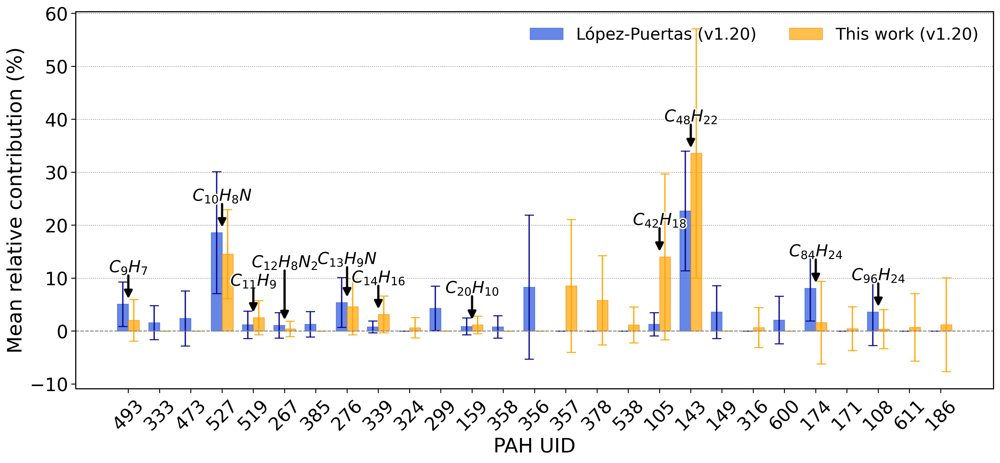

compare my v3.20 with López-Puertas v1.20
Overlapping UIDs: {159, 519, 358, 527}


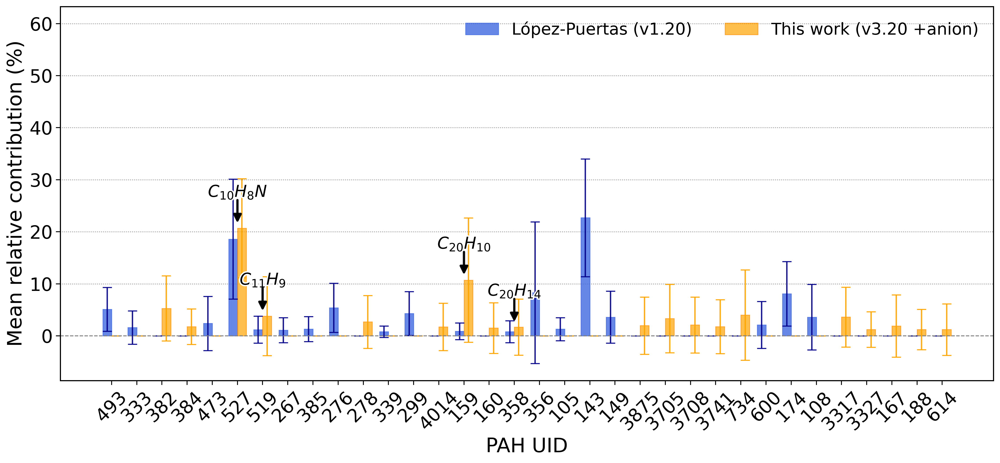

In [44]:
def plot_pah_comparison(df_table2, df_top20, pahdb_v3, label_top20="This work (v3.20 +anion)", output_filename="PAH_Contributions_Comparison.pdf"):
    # Ensure integer UID types
    df_table2["UID"] = df_table2["UID"].astype(int)
    df_top20["UID"] = df_top20["UID"].astype(int)

    # Find overlapping UIDs
    overlapping_uids = set(df_table2["UID"]).intersection(df_top20["UID"])
    print("Overlapping UIDs:", overlapping_uids)

    # Sort UIDs by carbon count
    uids_all = sorted(set(df_table2["UID"]).union(df_top20["UID"]))
    species_all = pahdb_v3.getspeciesbyuid(list(uids_all)).get()['data']
    uid_to_formula = {uid: species_all[uid]["formula"] for uid in species_all}
    uid_to_carbon = {uid: extract_carbon_count(uid_to_formula.get(uid, "")) for uid in uids_all}
    uids_ordered = sorted(uids_all, key=lambda uid: uid_to_carbon.get(uid, 0))
    x = np.arange(len(uids_ordered))
    uid_to_x = {uid: i for i, uid in enumerate(uids_ordered)}

    # Reindex data
    table2_data = df_table2.set_index("UID").reindex(uids_ordered).fillna(0)
    top20_data = df_top20.set_index("UID").reindex(uids_ordered).fillna(0)

    # Plotting
    bar_width = 0.35
    plt.figure(figsize=(16, 8), dpi=300)

    # López-Puertas bars
    plt.bar(
        x - bar_width / 2,
        table2_data["Concentration (%)"],
        yerr=table2_data["Precision (%)"],
        width=bar_width,
        capsize=5,  # ← increased for clarity
        color="royalblue",
        edgecolor="royalblue",
        alpha=0.8,
        label="López-Puertas (v1.20)",
        error_kw=dict(ecolor="darkblue", elinewidth=1.5, capthick=1.2, alpha=0.9)  # ← thicker error lines
    )

    # This work bars
    plt.bar(
        x + bar_width / 2,
        top20_data["Mean Relative Contribution (%)"],
        yerr=top20_data["Standard Deviation (%)"],
        width=bar_width,
        capsize=5,
        color="orange",
        edgecolor="darkorange",
        alpha=0.7,
        label=label_top20,
        error_kw=dict(ecolor="orange", elinewidth=1.5, capthick=1.2, alpha=0.9)
    )

    # Add horizontal gridlines at 10%, 20%, ...
    for y in range(10, 61, 10):
        plt.axhline(y, color='gray', linestyle=':', linewidth=0.8, zorder=0)

    plt.axhline(0, color='gray', linestyle='--', linewidth=1)

    label_positions = []

    for uid in overlapping_uids:
        formula = uid_to_formula.get(uid, "")
        formatted_formula = format_formula(formula)
        x_pos = uid_to_x[uid]
        y_val_v120 = table2_data.loc[uid, "Concentration (%)"]
        y_val_v320 = top20_data.loc[uid, "Mean Relative Contribution (%)"]
        base_y = max(y_val_v120, y_val_v320)

        if base_y > 0:
            # Initial label position
            label_y = base_y + 6.0
            arrow_y = base_y + 1.0

            # Check for overlap: adjust label_y if close to another label
            for existing_x, existing_y in label_positions:
                if abs(existing_x - x_pos) < 2 and abs(existing_y - label_y) < 3:
                    label_y = existing_y + 3.5  # push up

            label_positions.append((x_pos, label_y))

            # Plot label
            plt.text(
                x_pos, label_y, formatted_formula,
                ha="center", fontsize=18, fontweight="bold", color="black",
                path_effects=[
                    path_effects.Stroke(linewidth=3, foreground='white'),
                    path_effects.Normal()
                ]
            )

            # Plot arrow
            plt.annotate(
                '',
                xy=(x_pos, arrow_y),
                xytext=(x_pos, label_y - 0.6),
                arrowprops=dict(
                    arrowstyle='-|>',
                    color='black',
                    lw=2.5,
                    alpha=0.95,
                    shrinkA=0,
                    shrinkB=0,
                    mutation_scale=18
                ),
                annotation_clip=False
            )



    # Formatting
    plt.axhline(0, color='gray', linestyle='--', linewidth=1)
    plt.xticks(ticks=x, labels=[str(uid) for uid in uids_ordered], rotation=45, fontsize=20)
    plt.yticks(fontsize=20)
    # plt.ylim(-7, 40)
    plt.ylabel("Mean relative contribution (%)", fontsize=22)
    plt.xlabel("PAH UID", fontsize=22)
    plt.legend(fontsize=18, frameon=False, loc="upper right", ncol=2)
    plt.tight_layout(rect=(0.02, 0.05, 0.98, 0.95))
    plt.savefig(os.path.join(output_dir, output_filename), format="pdf", bbox_inches="tight", pad_inches=0.15)
    plt.show()

print("compare my v1.20 with López-Puertas v1.20")
plot_pah_comparison(df_table2, df_top20_v1, pahdb_v1, label_top20="This work (v1.20)", output_filename="PAH_Comparison_v120.pdf")
print("compare my v3.20 with López-Puertas v1.20")
plot_pah_comparison(df_table2, df_top20, pahdb_v3, label_top20="This work (v3.20 +anion)", output_filename="PAH_Comparison_v320.pdf")



## Ring Calculations

In [48]:
# Collect all UIDs used across all spec_labels and heights
all_uids = set()

for spec_label in mcfit_results:
    for height in mcfit_results[spec_label]:
        if 'mcfits' in mcfit_results[spec_label][height]:
            for fit in mcfit_results[spec_label][height]['mcfits']:
                all_uids.update(fit['uids'])

all_uids = list(all_uids)
print(f"Collected {len(all_uids)} unique UIDs")

# Define fallback-aware query function
def get_species_by_uid_multi(uid, primary_pahdb, fallback_pahdb):
    try:
        result = primary_pahdb.getspeciesbyuid([uid]).get()["data"]
        if uid in result:
            return result[uid]
    except Exception:
        pass

    try:
        result = fallback_pahdb.getspeciesbyuid([uid]).get()["data"]
        if uid in result:
            return result[uid]
    except Exception:
        pass

    return None  # Not found in either

# Build uid_to_formula and carbon_count with fallback
uid_to_formula = {}
carbon_count = {}
missing = []

for uid in all_uids:
    species = get_species_by_uid_multi(uid, pahdb, pahdb_v3)  # pahdb = v4
    if species and "formula" in species:
        formula = species["formula"]
        uid_to_formula[uid] = formula
        match = re.match(r"C(\d+)", formula)
        if match:
            carbon_count[uid] = int(match.group(1))
    else:
        missing.append(uid)

print("UIDs missing from all PAHdbs:", missing)


Collected 484 unique UIDs
UIDs missing from all PAHdbs: [8222, 4158, 4179, 8374, 8393, 8191, 8470, 6428, 6497, 6521, 6545, 6548, 6550, 6588, 6589, 6603, 6609, 6610, 6618, 6627, 6628, 6631, 6632, 6651, 6668, 8750, 6711, 6713, 8762, 8772, 8821, 8824, 10887, 6803, 10904, 8858, 8862, 8864, 8868, 8869, 8871, 8878, 8888, 8894, 8895, 6881, 8935, 8959, 8962, 8963, 8974, 8975, 6951, 7004, 9055, 7008, 9070, 9082, 9097, 9098, 9100, 9106, 9118, 9119, 7076, 7127, 9185, 7137, 9198, 9214, 9217, 9220, 9225, 9231, 9232, 9233, 7186, 7187, 7188, 9241, 9248, 9253, 9255, 9263, 9267, 9276, 9284, 7242, 9291, 7244, 7243, 7247, 9300, 9302, 7257, 7255, 9310, 9321, 9326, 7280, 9330, 9334, 9338, 9348, 9354, 9355, 9358, 9360, 9362, 7321, 7324, 9374, 7336, 9385, 9386, 9391, 9403, 7355, 9414, 9419, 7372, 7371, 9422, 9424, 9425, 9426, 9428, 9429, 7392, 7393, 7419, 7425, 7429, 7430, 7442, 7465, 7472, 7473, 7492, 7610, 9726, 7755, 3660, 7930, 8144, 8155]


In [49]:
def calculate_rings(mc_fit_results, pahdb, carbon_count):
    """
    Computes the weighted mean, median, std, sem, percentiles, and IQR of rings,
    mass, area, and carbon count for the 1000 MC run across heights.

    Returns:
    - results_dict: {height: {1000: {'rings': [...], 'mass/area': [...], 'carbon': ..., 'raw': {...}}}}
    """
    results_dict = {}

    for height, sample_sizes in mc_fit_results.items():
        results_dict[height] = {}
        print("at height:", height)

        # Only process the 1000 MC run
        if 1000 not in sample_sizes:
            print(f"Skipping {height} km: no 1000 MC run.")
            continue

        sample_size = 1000
        fit_data = sample_sizes[sample_size]
        if 'mcfits' not in fit_data or not isinstance(fit_data['mcfits'], list):
            print(f"Skipping {height} km, {sample_size} samples: no valid 'mcfits' data.")
            continue

        average_rings_per_run = []
        average_masses_per_run = []
        average_areas_per_run = []
        average_carbons_per_run = []
        # print("at mcfit:", sample_size)

        for fit in fit_data['mcfits']:
            if not isinstance(fit, dict) or 'uids' not in fit or 'weights' not in fit:
                print(f"Skipping invalid fit at {height} km, {sample_size} samples.")
                continue

            uids = fit['uids']
            weights = fit['weights']

            geometry = pahdb.getgeometrybyuid(uids)
            rings = geometry.rings()
            masses = geometry.mass()
            areas = geometry.area()

            rings_sum = {uid: sum(rings[uid].values()) for uid in uids}
            weight_array = np.array([weights[uid] for uid in uids])
            total_weight = np.sum(weight_array)
            normalized_weights = weight_array / total_weight if total_weight > 0 else np.zeros_like(weight_array)

            weighted_rings = np.sum([rings_sum[uid] * norm_w for uid, norm_w in zip(uids, normalized_weights)])
            weighted_masses = np.sum([masses[uid] * norm_w for uid, norm_w in zip(uids, normalized_weights)])
            weighted_areas = np.sum([areas[uid] * norm_w for uid, norm_w in zip(uids, normalized_weights)])
            weighted_carbons = np.sum([
                carbon_count[uid] * norm_w
                for uid, norm_w in zip(uids, normalized_weights)
                if uid in carbon_count
            ])

            average_rings_per_run.append(weighted_rings)
            average_masses_per_run.append(weighted_masses)
            average_areas_per_run.append(weighted_areas)
            average_carbons_per_run.append(weighted_carbons)

        # Compute full ring statistics
        if len(average_rings_per_run) > 0:
            rings_array = np.array(average_rings_per_run)
            mean_rings = np.mean(rings_array)
            median_rings = np.median(rings_array)
            std_rings = np.std(rings_array, ddof=1) if len(rings_array) > 1 else 0
            sem_rings = std_rings / np.sqrt(len(rings_array)) if len(rings_array) > 1 else 0
            p25 = np.percentile(rings_array, 25)
            p75 = np.percentile(rings_array, 75)
            iqr = p75 - p25

            mean_mass = np.mean(average_masses_per_run)
            mean_area = np.mean(average_areas_per_run)
            mean_carbon = np.mean(average_carbons_per_run)

            results_dict[height][sample_size] = {
                'rings': {
                    'mean': round(mean_rings, 2),
                    'median': round(median_rings, 2),
                    'std': round(std_rings, 2),
                    'sem': round(sem_rings, 2),
                    'p25': round(p25, 2),
                    'p75': round(p75, 2),
                    'iqr': round(iqr, 2)
                },
                'mass/area': [round(mean_mass, 2), round(mean_area, 2)],
                'carbon': round(mean_carbon, 2),
                'raw': {
                    'rings': average_rings_per_run,
                    'mass': average_masses_per_run,
                    'area': average_areas_per_run,
                    'carbon': average_carbons_per_run
                }
            }

    return results_dict


In [50]:
# Build carbon_counts: {spec_label: {uid: carbon_count}}
carbon_counts = {}
for spec_label, (_, pahdb_obj) in trans_pickles.items():
    # Get all UIDs used in this spec_label
    all_uids = set()
    for height in mcfit_results.get(spec_label, {}):
        if 'mcfits' in mcfit_results[spec_label][height]:
            for fit in mcfit_results[spec_label][height]['mcfits']:
                all_uids.update(fit['uids'])
    # Get formulas for these UIDs
    species_data = pahdb_obj.getspeciesbyuid(list(all_uids)).get()['data']
    carbon_counts[spec_label] = {uid: extract_carbon_count(species_data[uid]['formula']) for uid in species_data}

rings_stats_per_version = {}

for spec_label in mcfit_results:
    print(f"Calculating ring statistics for {spec_label}")

    mcfit_by_height = {
        int(h): {1000: {'mcfits': mcfit_results[spec_label][h]['mcfits']}}
        for h in mcfit_results[spec_label]
        if 'mcfits' in mcfit_results[spec_label][h]
    }

    _, pahdb = trans_pickles[spec_label]
    carbon_map = carbon_counts[spec_label]

    result = calculate_rings(mcfit_by_height, pahdb, carbon_map)
    rings_stats_per_version[spec_label] = result


Calculating ring statistics for v1.20_neutral
at height: 900
at height: 950
at height: 1000
Calculating ring statistics for v3.20_neutral_anion
at height: 900
at height: 950
at height: 1000
Calculating ring statistics for v3.20_small_neutral_anion
at height: 900
at height: 950
at height: 1000
Calculating ring statistics for v4.00_neutral_anion
at height: 900
at height: 950
at height: 1000
Calculating ring statistics for v4.00_small_neutral_anion
at height: 900
at height: 950
at height: 1000


In [51]:
rings_stats_per_version['v3.20_neutral_anion'][1000][1000]['rings']

{'mean': np.float64(17.98),
 'median': np.float64(16.96),
 'std': np.float64(6.78),
 'sem': np.float64(0.21),
 'p25': np.float64(12.9),
 'p75': np.float64(22.13),
 'iqr': np.float64(9.23)}

Plotting ring count distribution for v1.20_neutral
median ring count for v1.20_neutral at 900 km: 8.90
with a standard deviation of 2.07
median ring count for v1.20_neutral at 950 km: 8.81
with a standard deviation of 2.93
median ring count for v1.20_neutral at 1000 km: 10.66
with a standard deviation of 7.13


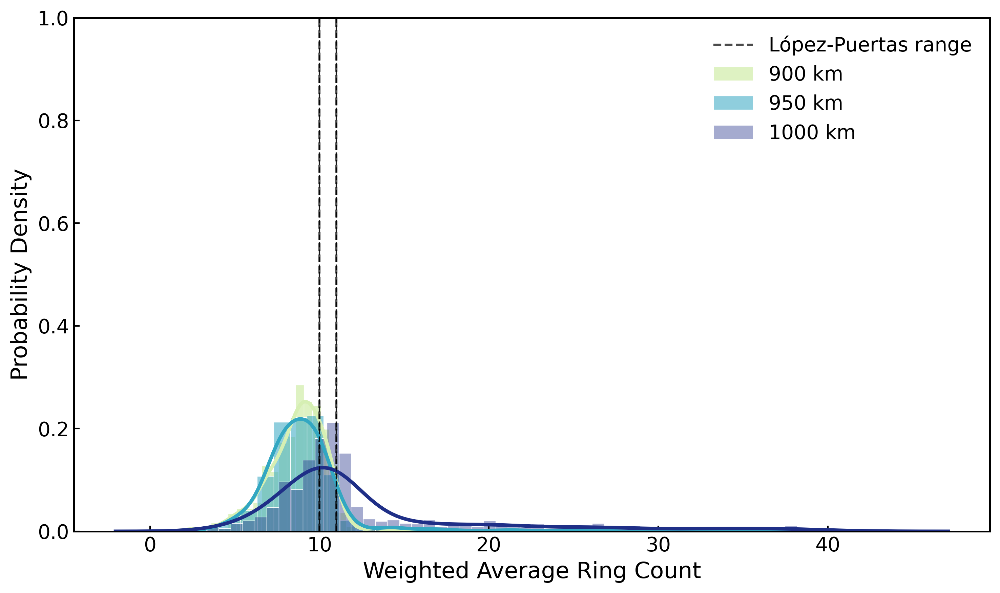

Plotting ring count distribution for v3.20_neutral_anion
median ring count for v3.20_neutral_anion at 900 km: 11.29
with a standard deviation of 4.36
median ring count for v3.20_neutral_anion at 950 km: 13.65
with a standard deviation of 5.46
median ring count for v3.20_neutral_anion at 1000 km: 16.96
with a standard deviation of 6.78


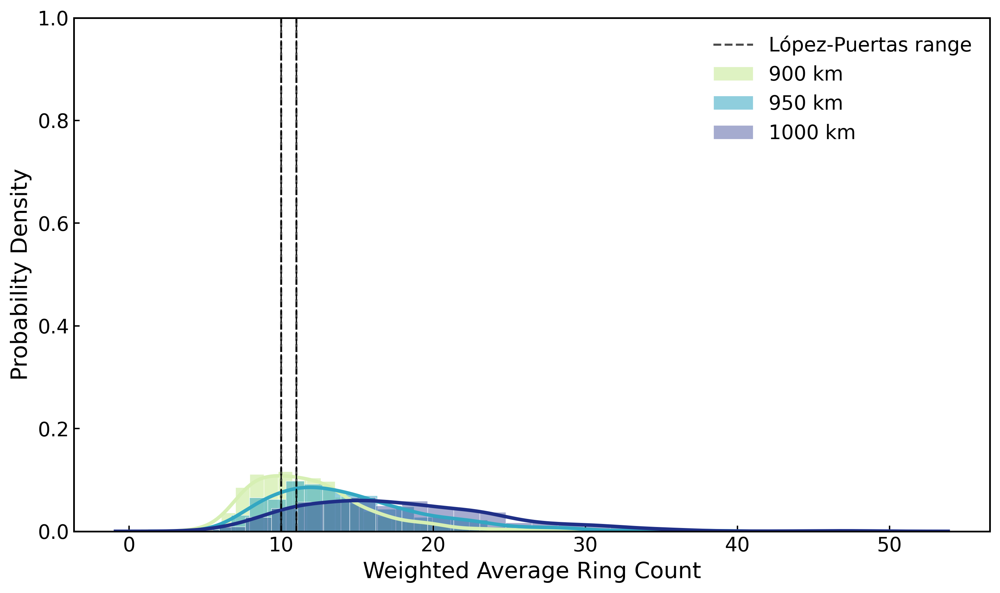

Plotting ring count distribution for v3.20_small_neutral_anion
median ring count for v3.20_small_neutral_anion at 900 km: 3.32
with a standard deviation of 0.42
median ring count for v3.20_small_neutral_anion at 950 km: 3.44
with a standard deviation of 0.47
median ring count for v3.20_small_neutral_anion at 1000 km: 3.69
with a standard deviation of 0.53


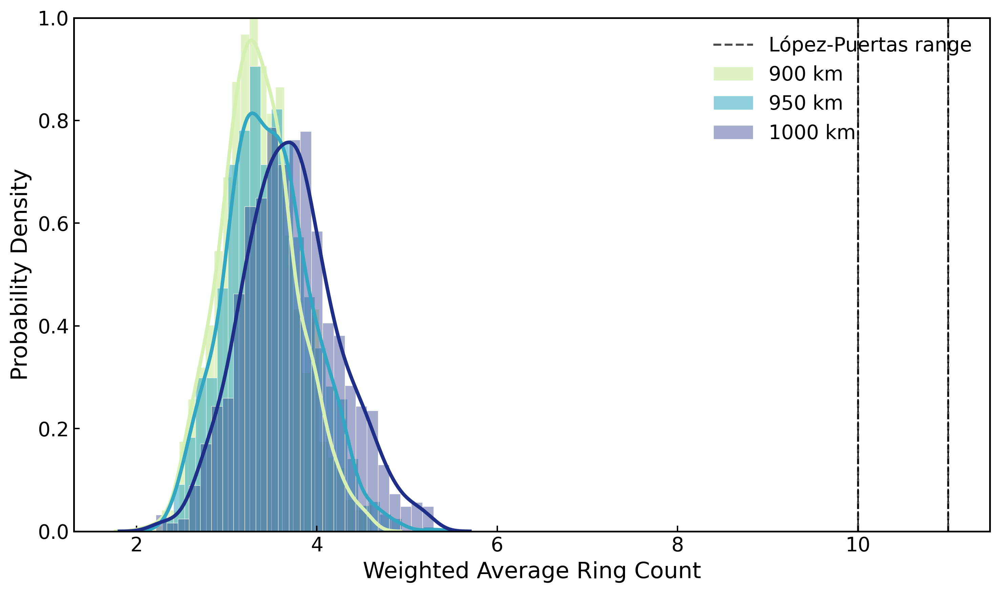

Plotting ring count distribution for v4.00_neutral_anion
median ring count for v4.00_neutral_anion at 900 km: 19.52
with a standard deviation of 3.72
median ring count for v4.00_neutral_anion at 950 km: 19.41
with a standard deviation of 3.46
median ring count for v4.00_neutral_anion at 1000 km: 20.66
with a standard deviation of 4.32


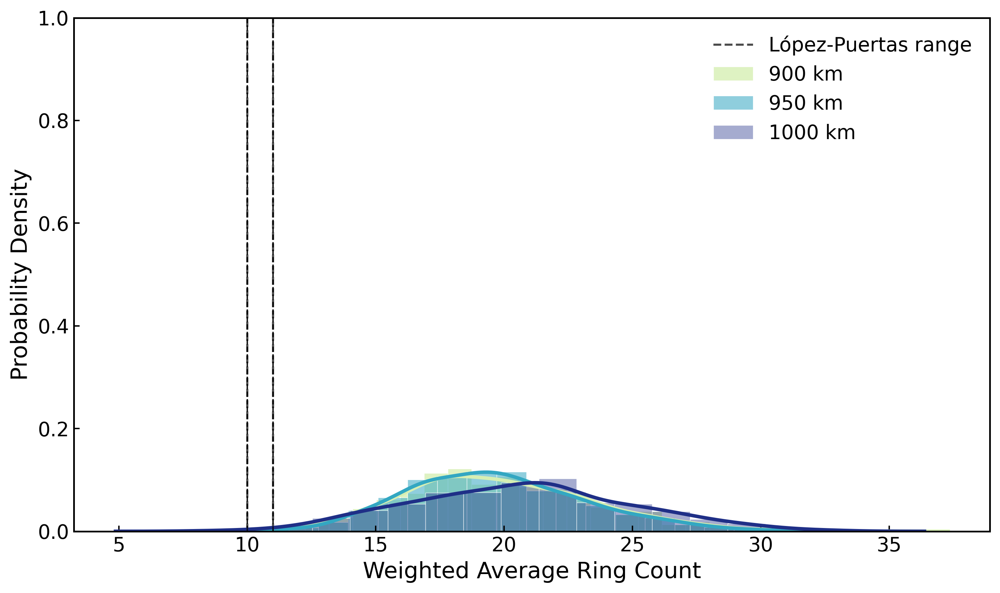

Plotting ring count distribution for v4.00_small_neutral_anion
median ring count for v4.00_small_neutral_anion at 900 km: 4.50
with a standard deviation of 0.92
median ring count for v4.00_small_neutral_anion at 950 km: 4.73
with a standard deviation of 0.83
median ring count for v4.00_small_neutral_anion at 1000 km: 4.73
with a standard deviation of 0.76


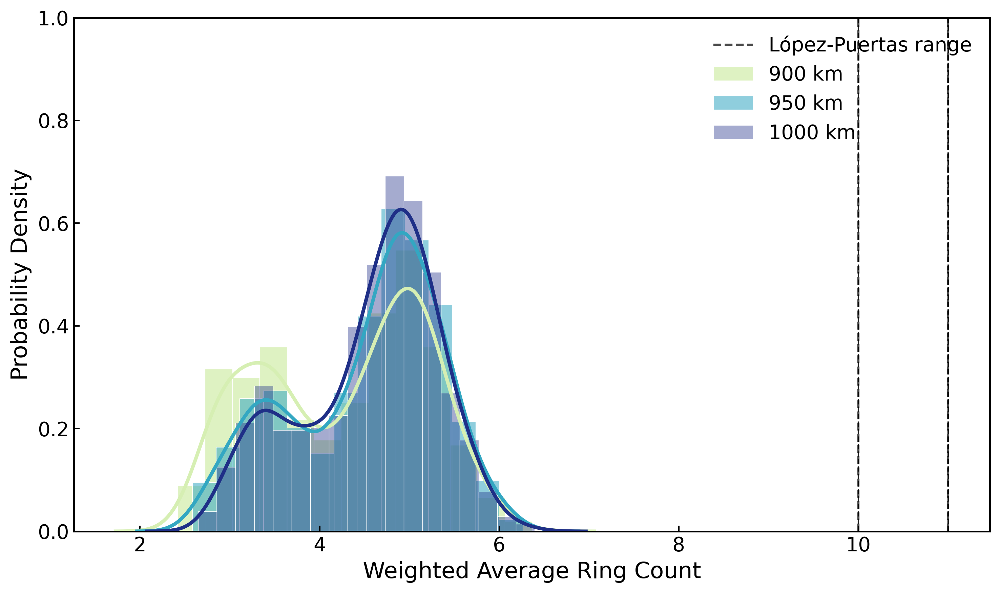

In [53]:
sample_size = 1000
heights = ["900", "950", "1000"]

for version in rings_stats_per_version:
    fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
    added_range_label = False
    print(f"Plotting ring count distribution for {version}")
    for height in heights:
        height_int = int(height)
        if sample_size in rings_stats_per_version[version].get(height_int, {}):
            median_ring = rings_stats_per_version[version][height_int][sample_size]['rings']['median']
            std_ring = rings_stats_per_version[version][height_int][sample_size]['rings']['std']
            print(f"median ring count for {version} at {height} km: {median_ring:.2f}")
            print(f"with a standard deviation of {std_ring:.2f}")


    for height in sorted(heights, key=int):  # Plot higher altitudes last
        height_int = int(height)
        if sample_size not in rings_stats_per_version[version].get(height_int, {}):
            continue

        rings = np.array(rings_stats_per_version[version][height_int][sample_size]['raw']['rings'])
        color = height_colors[height]
        mean = np.mean(rings)
        std = np.std(rings)

        # Knuth binning
        try:
            bin_width = knuth_bin_width(rings)
            bins = int((rings.max() - rings.min()) / bin_width)
        except Exception:
            bins = 30

        # Visual emphasis (different per height)
        if height == "1000":
            lw, alpha_kde, alpha_hist = 2.5, 1, 0.4
        elif height == "950":
            lw, alpha_kde, alpha_hist = 2.5, 1, 0.55
        else:  # 900
            lw, alpha_kde, alpha_hist = 2.5, 1, 0.8

        # Histogram
        sns.histplot(rings, bins=bins, kde=False, stat='density', ax=ax,
                     color=color, label=f"{height} km", edgecolor='white', linewidth=0.3, alpha=alpha_hist)

        # KDE
        sns.kdeplot(rings, ax=ax, color=color, linewidth=lw, alpha=alpha_kde)

        # LP2013 range lines
        if not added_range_label:
            ax.axvline(10, color='black', linestyle='--', linewidth=1.5, alpha=0.7, label='López-Puertas range')
            ax.axvline(11, color='black', linestyle='--', linewidth=1.5, alpha=0.7)
            added_range_label = True
        else:
            ax.axvline(10, color='black', linestyle='--', linewidth=1, alpha=0.7)
            ax.axvline(11, color='black', linestyle='--', linewidth=1, alpha=0.7)

    # Plot formatting
    ax.set_xlabel("Weighted Average Ring Count", fontsize=16)
    ax.set_ylabel("Probability Density", fontsize=16)
    # ax.set_xlim(0, 50)
    ax.tick_params(direction='in', length=4, width=1, labelsize=14)
    ax.legend(loc='upper right', fontsize=14, title_fontsize=16,
              frameon=False, facecolor='white', edgecolor='black')

    ax.set_ylim(0, 1)

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"ring_count_distribution_{version}.png"), dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
raise SystemExit("Stopping notebook here")

## Making Singular PAH plots

In [92]:
# Put interesting UIDs in a list
interesting_uids = [
    527, 278, 382, 384, 159, 299, 538, 493, 816,
    143, 339, 3317, 3324, 3545, 3705, 3875, 614, 802,
    4015, 3741, 8858, 8975, 9362, 8862, 7755, 7392,
    3996, 733, 269, 554, 521, 64, 52
] # {159, 519, 358, 527} overlapping with v1.20 #143 dissapears from v3.20
# 382 anion counterpart to 527 without the N, prominent in v3.20, 743 biggest one in v3.20
output_dir = "plots"
os.makedirs(output_dir, exist_ok=True)
#load the SORCE solar data
sorcedata = 'Sun_SORCE/sorce_processed_data.csv'
irradiance_data = pd.read_csv(sorcedata)
august_data = irradiance_data[irradiance_data['month'] == 'august']
wavel = np.array(august_data['wavelength'])
irrad = np.array(august_data['irradiance'])
print("SORCE data loaded successfully.")

uv_spectrum = {
    "frequency": 1e7 / np.flip(wavel),
    "intensity": 1e-4 * np.flip(irrad * wavel**2) / (4 * np.pi),
}

single_fits = {}

for uid in interesting_uids:
    print(f"Processing UID: {uid}")
    
    # Isolate just this molecule
    single_trans = pahdb_v4.gettransitionsbyuid([uid])

    # Cascade emission
    single_trans.cascade(
        uv_spectrum, star=True, stellar_model=True, convolved=True,
        multiprocessing=False, cache=False
    )
    # single_trans.shift(-15.0)

    # Convolve to VIMS resolution (assumes grid from one obs)
    grid = obs900.getgrid()
    if grid is None or len(grid) == 0 or len(single_trans.uids) == 0:
        print(f"Skipping UID {uid}: empty grid or transitions.")
        continue

    int_spectrum = single_trans.convolve(grid=grid, fwhm=15.0)

    # Store fits per UID
    single_fits[uid] = {}

    for label, spectrum in spectra.items():
        print(f"Fitting UID {uid} to {label} @ {obs_label} km")
        try:
            fit = int_spectrum.fit(obs, method="NNLC", normalization="max")
            single_fits[uid][(label, obs_label)] = fit
        except ValueError as e:
            print(f"Fit failed for UID {uid} on {label} @ {obs_label} km: {e}")
            continue


# Plot results
for uid, fits in single_fits.items():
    for (spec_label, obs_label), fit in fits.items():
        print(f"Plotting UID {uid} fit for {spec_label} at {obs_label} km")
        # fit.plot(wavelength=True, sigma=True, save=True, output=f"fit_{uid}_{spec_label}_{obs_label}.pdf", ftype="pdf")
        fit.plot(
            wavelength=True,
            residual=True,
            sigma=True,
            save=True,
            output=os.path.join(output_dir, f"FINALonePAHfit_{uid}_{spec_label}_{obs_label}.pdf"),
            ftype="pdf"
        )
        # fit.plot(wavelength=True, charge=True, sigma=True)
        # fit.plot(wavelength=True, size=True, sigma=True)
        # fit.plot(sizedistribution=True, sigma=True)

print(f"Number of fits stored: {len(single_fits)}")


SORCE data loaded successfully.
Processing UID: 527
            APPLYING CASCADE EMISSION MODEL            

 STELLAR MODEL SELECTED: USING FIRST PARAMETER AS MODEL

          REBINNING STELLAR MODEL: 100 POINTS          

CALCULATED EFFECTIVE TEMPERATURE: 126.24990828203434 Kelvin

         CONVOLVING WITH ENTIRE RADIATION FIELD        

SPECIES                          : 1/1
UID                              : 527
MEAN ABSORBED ENERGY             : 3.441827379121531 +/- 0.69327918223809 eV
MAXIMUM ATTAINED TEMPERATURE     : 1430.7684741759986 Kelvin
ENERGY CONSERVATION IN SPECTRUM  : 1.023016233442149
ELAPSED TIME                     : 0:00:04.683626

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2942.284, 3177.963); 16 POINTS   

                     FWHM: 15.0 /cm                    

Fitting UID 527 to v1.20_neutral @ 950 km
                       DOING NNLC                      

Fitting UID 527 to v3.20_neutral_anion @ 950 km
                     

KeyboardInterrupt: 

In [ ]:
single_fits = {}

# Loop over spectra and observations
for label, spectrum in spectra.items():
    single_fits[label] = {}
    print(f"Fitting spectrum: {label}")
    for obs_label, obs in observations.items():
        single_fit = spectrum.fit(obs, method="NNLC", normalization="max")
        single_fits[label][obs_label] = single_fit

for spec_label, obs_fits in single_fits.items():
    for obs_label, fit in obs_fits.items():
        print(f"Plotting fit for {spec_label} at {obs_label} km")
        fit.plot(wavelength=True, sigma=True)
        fit.plot(wavelength=True, residual=True, sigma=True)
        fit.plot(wavelength=True, charge=True, sigma=True)
        fit.plot(wavelength=True, size=True, sigma=True)
        fit.plot(sizedistribution=True, sigma=True)

# Making plots for presentation

## 1. dirac delta functions

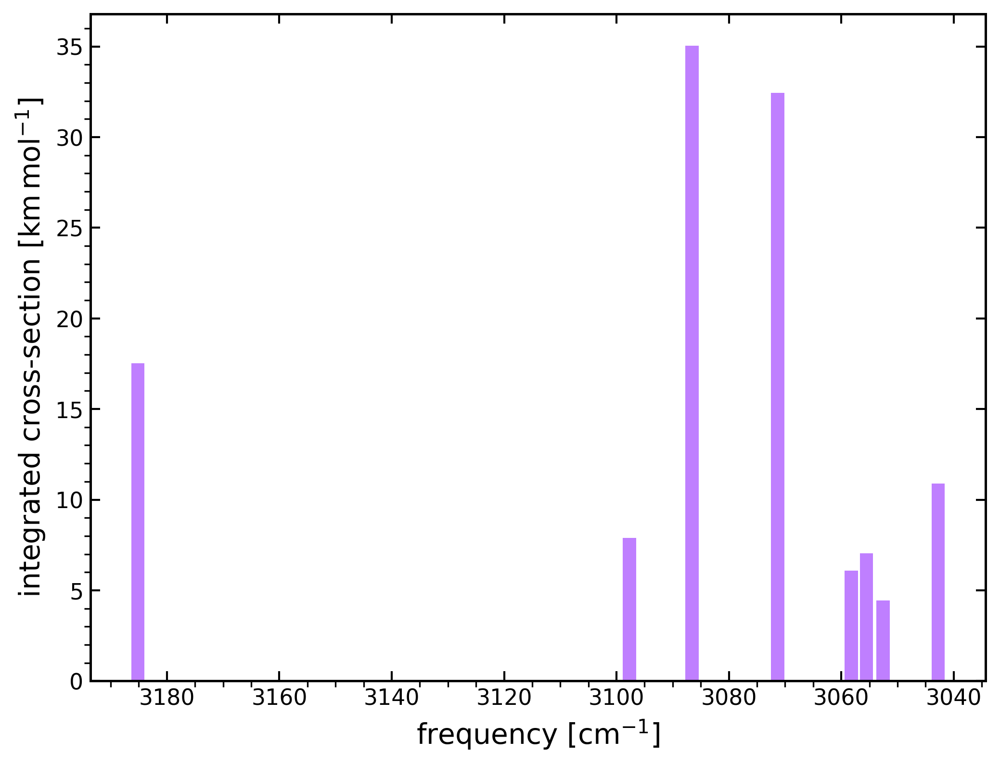

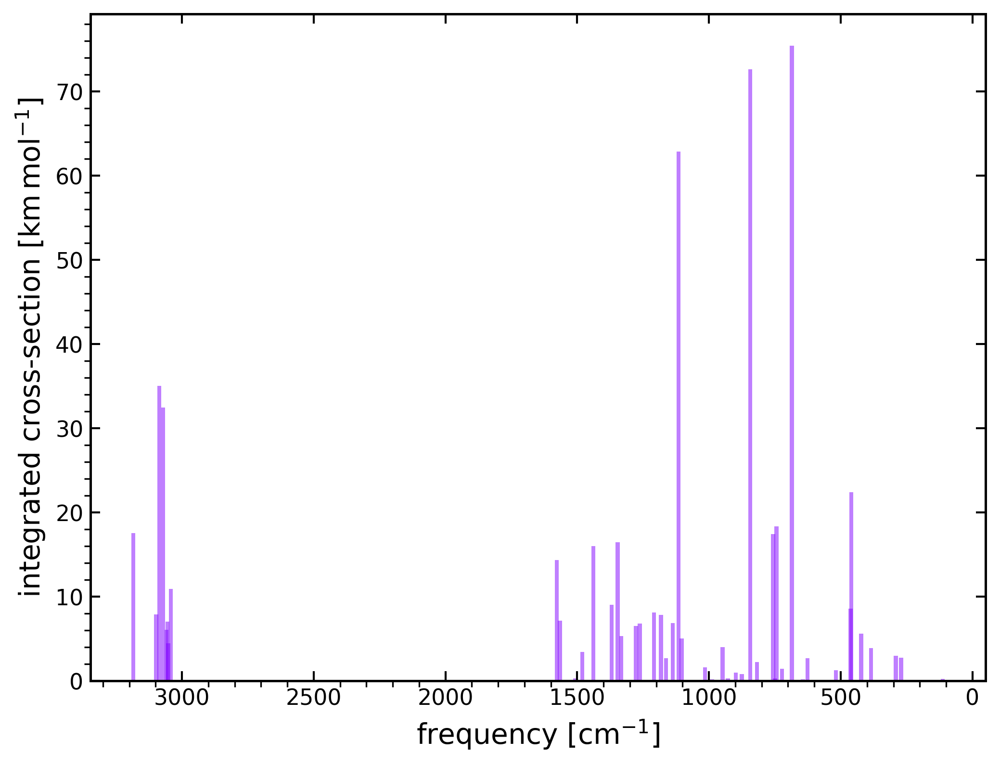

In [73]:
xrange = 1e4 / np.array([3.5, 3])
transitions_527 = pahdb_v3.gettransitionsbyuid(527)
transitions_527.plot(show=True, xrange=xrange)
transitions_527.plot(show=True)

              USING GAUSSIAN LINE PROFILES             

    GRID: (XMIN,XMAX)=(1.000, 4000.000); 400 POINTS    

                     FWHM: 15.0 /cm                    



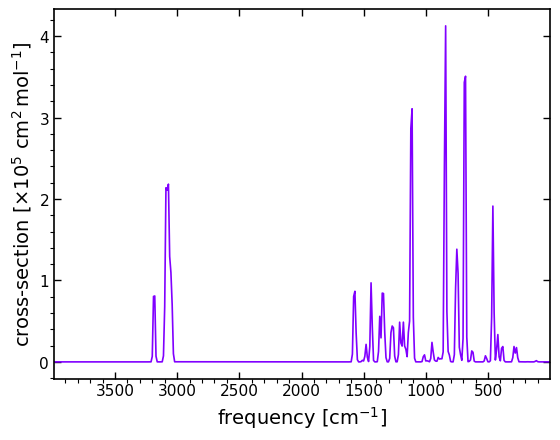

             USING LORENTZIAN LINE PROFILES            

   GRID: (XMIN,XMAX)=(2857.143, 3333.333); 400 POINTS  

                     FWHM: 15.0 /cm                    



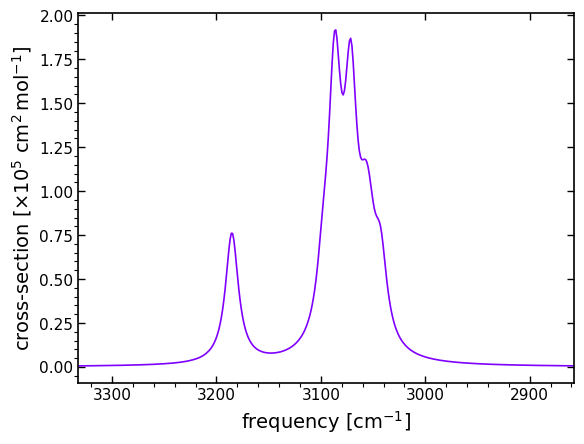

In [74]:
convolved = transitions_527.convolve(fwhm=15.0, gaussian=True, multiprocessing=False)
convolved.plot(show=True)

xrange = 1e4 / np.array([3.5, 3])
spectrum_527 = transitions_527.convolve(xrange=xrange, multiprocessing=False)
coadded_527 = spectrum_527.coadd()
coadded_527.plot()


In [75]:
plottie = coadded_527.get()
data = plottie['data'][0]
freq = plottie['grid']
wavelength = 1e4 / freq  # Convert frequency to wavelength in micrometers


In [76]:
trans527dic = transitions_527.get()
trans527dic['data'][527][0]

{'scale': 0.9563, 'frequency': 112.3587, 'intensity': 0.2447, 'symmetry': 'A"'}

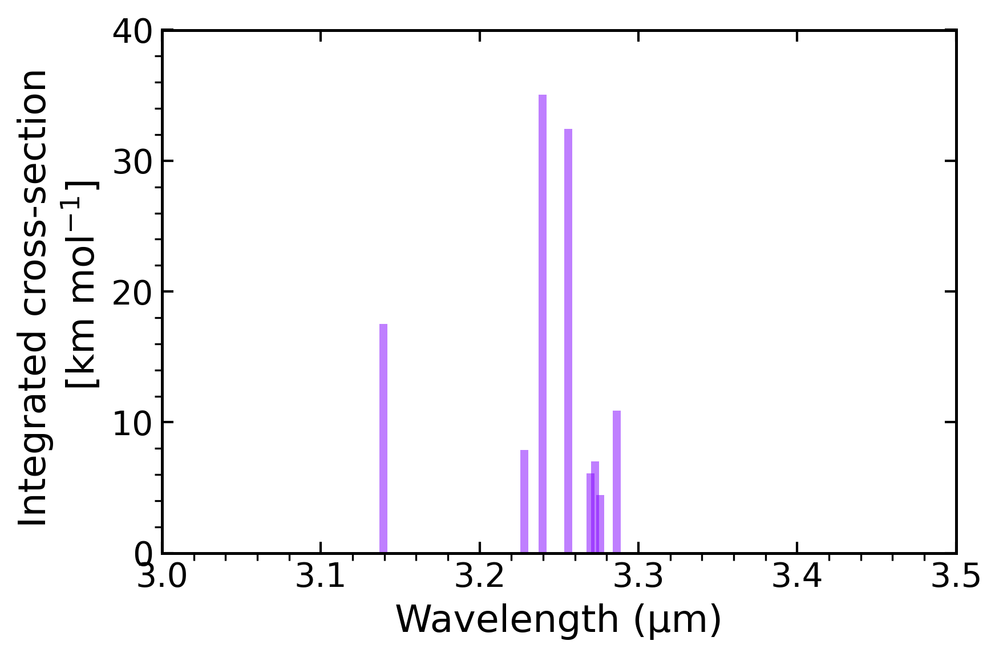

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

def plot_transitions(transitions, xrange=None, title=None):
    """
    Plot PAH transitions (frequency or wavelength) as bar charts, styled like NASA Ames.
    
    :param transitions: list of dicts with keys 'frequency', 'intensity', and 'scale'
    :param xrange: tuple (min, max) for the x-axis in wavelength or frequency
    :param title: optional plot title
    """
    # Choose whether to plot in frequency or wavelength
    mode = 'wavelength'  # change to 'frequency' if you prefer original units
    
    freqs = np.array([t['frequency'] for t in transitions])
    intens = np.array([t['intensity'] for t in transitions])

    if mode == 'wavelength':
        x = 1e4 / freqs
        xlabel = "Wavelength (µm)"
    else:
        x = freqs
        xlabel = "Frequency (cm⁻¹)"
    y = intens

    # Plot setup
    fig, ax = plt.subplots(figsize=(6, 4), dpi=300)
    ax.minorticks_on()
    ax.tick_params(which='major', right=True, top=True, direction='in')
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # Match NASA color style (rainbow for multiple UIDs)
    cmap = mpl.colormaps['rainbow']
    uid_colors = cmap(np.linspace(0,1,1))  # assuming one UID; expand if more

    # Plot bar chart
    ax.bar(x, y, width=(0.005) if len(x)>1 else 0.005, color=uid_colors[0], alpha=0.5)

    # # Invert axis if wavelength mode
    # if mode == 'wavelength':
    #     # ax.invert_xaxis()

    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel("Integrated cross-section \n [km mol$^{-1}$]", fontsize=16)
    if xrange:
        ax.set_xlim(*xrange)

    ax.invert_xaxis()  # Invert x-axis for wavelength
    ax.set_ylim(0, 40)

    plt.tight_layout()
    plt.savefig("/Users/floorstikkelbroeck/Documents/Titan/RESULTS/dirac527_extended.png", dpi=900, bbox_inches='tight')
    plt.show()


transitions = transitions_527.get()['data'][527]
plot_transitions(transitions,
                 xrange=(3.5, 3),
                 title="PAH Transitions (UID 527)")


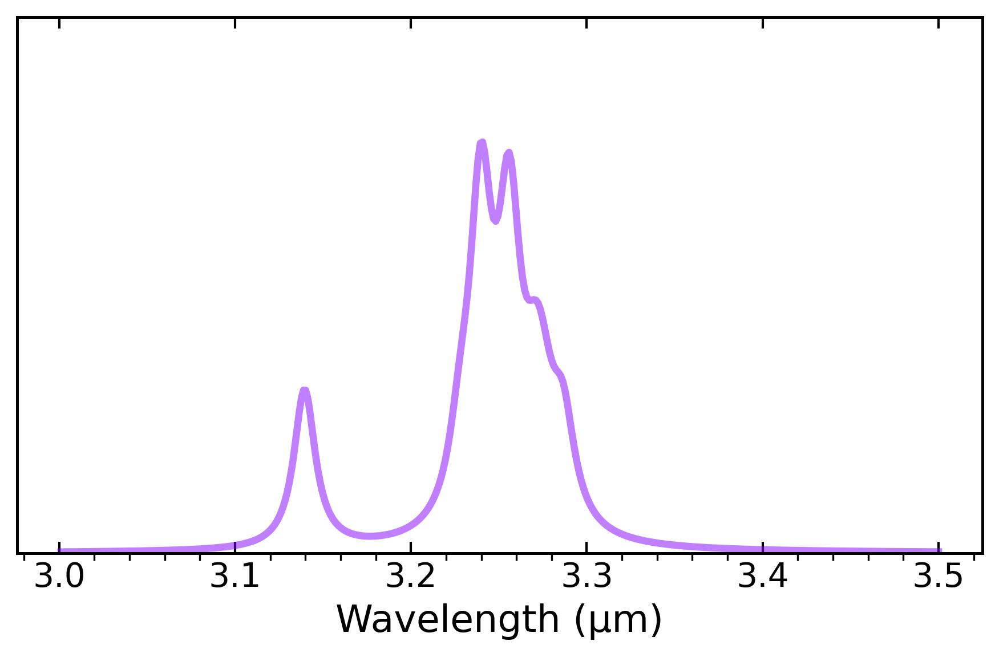

In [80]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=300)
data_10 = data*10

cmap = mpl.colormaps['rainbow']
uid_colors = cmap(np.linspace(0,1,1))  # assuming one UID; expand if more

ax.plot(wavelength, data_10, label='Convolved Spectrum', linewidth=3, color=uid_colors[0], alpha=0.5)
ax.set_xlabel("Wavelength (μm)", fontsize=16)
# ax.set_ylabel("Integrated cross-section \n [km mol$^{-1}$]", fontsize=16)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.minorticks_on()
ax.tick_params(which='major', right=True, top=True, direction='in')

# Set y-axis limits and ticks manually
ax.set_ylim(0, 25)
# ax.set_yticks(np.arange(0, 71, 10))  # ticks every 10 units: 0,10,...,70

#delete the y-axis
ax.yaxis.set_visible(False)

plt.tight_layout()
plt.savefig("/Users/floorstikkelbroeck/Documents/Titan/RESULTS/convolved527_extended.png", dpi=900, bbox_inches='tight')
plt.show()


In [ ]:
# Predict 3 - 20 µm spectrum
transitions.intersect(fit.getuids())

xrange = 1e4 / np.array([20.0, 3.0])

spectrum = transitions.convolve(xrange=xrange, gaussian=True, multiprocessing=False)

coadded = spectrum.coadd(weights=fit.getweights())

coadded.plot()
    

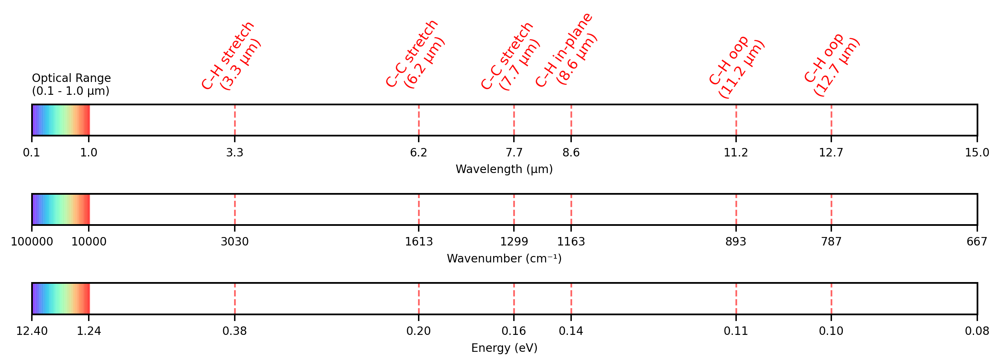

In [81]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Define ticks in wavelength (μm), and convert to wavenumber and energy
wl_ticks = np.array([0.1, 1, 3.3, 6.2, 7.7, 8.6, 11.2, 12.7, 15])
wn_ticks = 1e4 / wl_ticks  # cm^-1
eV_ticks = wn_ticks * 1.23984e-4  # eV

# Major PAH bands and labels
pah_bands = {
    3.3: "C–H stretch",
    6.2: "C–C stretch",
    7.7: "C–C stretch",
    8.6: "C–H in-plane",
    11.2: "C–H oop",
    12.7: "C–H oop"
}

# Set up color map for optical range shading
cmap = plt.get_cmap('rainbow')
norm = mcolors.Normalize(vmin=0.1, vmax=1.0)

# Function to add optical rainbow shading
def add_optical_shading(ax):
    for wl in np.linspace(0.1, 1.0, 100):
        color = cmap(norm(wl))
        ax.axvspan(wl, wl + 0.01, color=color, alpha=0.3)

# Create figure
fig, axs = plt.subplots(3, 1, figsize=(10, 4), dpi=300)
fig.subplots_adjust(hspace=0.8)

fontsize = 8

# 1. Wavelength axis
ax = axs[0]
ax.set_xlim(wl_ticks.min(), wl_ticks.max())
ax.set_xticks(wl_ticks)
ax.set_xticklabels([f"{x:.1f}" for x in wl_ticks], fontsize=fontsize)
ax.set_yticks([])
ax.set_xlabel("Wavelength (μm)", fontsize=fontsize)
add_optical_shading(ax)

for i, (band, label) in enumerate(pah_bands.items()):
    y_pos = 1.08 if i % 2 == 0 else 1.15
    ax.axvline(band, color='red', linestyle='--', alpha=0.6)
    ax.text(
        band, y_pos, f"{label}\n({band:.1f} μm)", rotation=55,
        transform=ax.get_xaxis_transform(), ha='center', va='bottom',
        fontsize=10, color='red'
    )

ax.text(0.1, 2, "Optical Range\n(0.1 - 1.0 μm)", fontsize=8,
        color='black', ha='left', va='top', transform=ax.transData)

# 2. Wavenumber axis
ax = axs[1]
ax.set_xlim(wl_ticks.min(), wl_ticks.max())
ax.set_xticks(wl_ticks)
ax.set_xticklabels([f"{x:.0f}" for x in wn_ticks], fontsize=fontsize)
ax.set_yticks([])
ax.set_xlabel("Wavenumber (cm⁻¹)", fontsize=fontsize)
add_optical_shading(ax)

for band in pah_bands:
    ax.axvline(band, color='red', linestyle='--', alpha=0.6)

# 3. Energy axis
ax = axs[2]
ax.set_xlim(wl_ticks.min(), wl_ticks.max())
ax.set_xticks(wl_ticks)
ax.set_xticklabels([f"{x:.2f}" for x in eV_ticks], fontsize=fontsize)
ax.set_yticks([])
ax.set_xlabel("Energy (eV)", fontsize=fontsize)
add_optical_shading(ax)

for band in pah_bands:
    ax.axvline(band, color='red', linestyle='--', alpha=0.6)

# Use tight_layout with additional space at bottom
plt.tight_layout(rect=(0, 0.05, 1, 1))
plt.show()

## 2. geometry

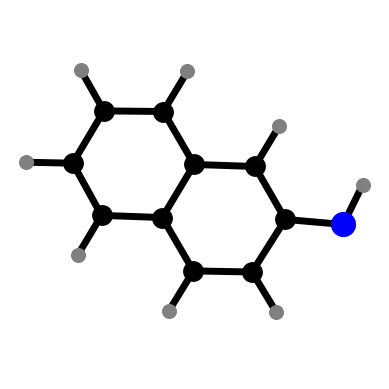

In [87]:
uid = 527
geometry = pahdb_v3.getgeometrybyuid(uid)
geometry.diagonalize()
for uid in [uid]:
    geometry.plot(uid)

In [ ]:
geometry.formula(527)

## 3. Fitting examples 

In [ ]:
titan900 = obs900.get()
flux = titan900['spectrum'].flux
unc = titan900['spectrum'].uncertainty.array
wn = titan900['spectrum'].spectral_axis
wl = 1e4 / wn  # Convert wavenumber to wavelength in micrometers

nnlc_params = flux/unc

#convert these to numpy arrays
flux = np.array(flux)
unc = np.array(unc)
wn = np.array(wn)
wl = np.array(wl)
nnlc_params = np.array(nnlc_params)

In [ ]:
# Set up figure with two vertically stacked axes (shared x-axis)
fig, (ax, ax_resid) = plt.subplots(
    2, 1, figsize=(8, 6), dpi=300, gridspec_kw={"height_ratios": [3, 1]}, sharex=True
)

# --- Main Plot ---
# ax2 = ax.twinx()
# ax2.set_ylabel('NNLC Parameters', fontsize=14)
# # ax2.yaxis.label.set_color('orange')
# ax.yaxis.label.set_color('navy')
# # ax2.tick_params(axis='y', colors='orange')
# ax2.plot(wl, nnlc_params, color='orange', linestyle='-', label='NNLC Parameters')

ax.errorbar(wl, flux, yerr=unc, fmt='o-', color='navy', ecolor='gray', elinewidth=1, capsize=2, label='Titan 900 km')
ax.set_xlabel('Wavelength (μm)', fontsize=14)
ax.set_ylabel('NNLS Parameters \n Surface Brightness (MJy/sr)', fontsize=14)
ax.set_ylim(-0.3, 1)
ax.grid(True, which='both', linestyle=':', linewidth=0.7, alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=12, length=6, color='navy')

# --- Residuals Panel ---
#make the residual y-axis ticks be not visible
ax_resid.tick_params(axis='y', which='both', labelleft=False, labelright=False)
ax_resid.axhline(0, color='gray', linewidth=0.8, linestyle='--')
ax_resid.set_ylabel("Residuals", fontsize=12)
# ax_resid.set_ylim(-0.5, 0.5)
ax_resid.tick_params(axis='both', which='major', labelsize=10, length=5)
ax_resid.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

# Label bottom axis
ax_resid.set_xlabel('Wavelength (μm)', fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
# Reconstruct a more realistic dummy NNLC fit with matching scale
# Create a normalized version of the flux
norm_flux = flux / unc
# Simulate a fit in normalized (chi-square) space
fit_norm = norm_flux + np.random.normal(0, 0.5, size=norm_flux.shape)
# Convert back to flux space
fit_good_nnlc = fit_norm * unc

# Recalculate chi-squared per point
chi_squared_nnlc = ((flux - fit_good_nnlc) / unc) ** 2

# Plotting
fig, (ax, ax_chi) = plt.subplots(2, 1, figsize=(8, 6), dpi=300,
                                 gridspec_kw={"height_ratios": [3, 1]}, sharex=True)

ax2 = ax.twinx()
ax2.set_ylabel('NNLC Parameters', fontsize=14)
ax2.yaxis.label.set_color('orange')
ax.yaxis.label.set_color('navy')
ax2.tick_params(axis='y', colors='orange')
ax2.plot(wl, nnlc_params, color='orange', linestyle='-', label='NNLC Parameters')

# Main spectrum plot
ax.errorbar(wl, flux, yerr=unc, fmt='o-', color='navy', ecolor='gray',
            elinewidth=1.5, capsize=2, label='Observed Flux')
ax.plot(wl, fit_good_nnlc, '--', color='green', label='NNLC Fit')
ax.set_ylabel("Surface Brightness (MJy/sr)", fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.legend(loc="upper left", fontsize=10)

# Chi-squared contribution plot
ax_chi.axhline(0, color='gray', linewidth=0.8, linestyle='--')
ax_chi.plot(wl, chi_squared_nnlc, 'o-', color='darkorange', markersize=4)
ax_chi.set_ylabel("$\chi^2_i$", fontsize=12)
ax_chi.set_xlabel("Wavelength (μm)", fontsize=14)
ax_chi.tick_params(axis='both', labelsize=10)
ax_chi.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

plt.rcParams.update({
    "font.family": "sans-serif",
    "font.sans-serif": ["DejaVu Sans"],  # Or ["Arial"] if preferred
    "font.size": 18,                     # Base font size
    "axes.labelsize": 18,               # Axis label size
    "axes.titlesize": 20,               # Axis title size
    "xtick.labelsize": 16,              # Tick label size
    "ytick.labelsize": 16,
    "legend.fontsize": 16,
    "lines.linewidth": 2.0,             # Line thickness
    "lines.markersize": 7,              # Marker size
    "axes.linewidth": 1.5,              # Axis line thickness
    "xtick.major.width": 1.2,
    "ytick.major.width": 1.2,
    "xtick.major.size": 6,
    "ytick.major.size": 6,
    "xtick.minor.size": 3,
    "ytick.minor.size": 3,
    "savefig.dpi": 300,
    "figure.dpi": 300,
    "figure.figsize": (10, 6),
    "legend.frameon": False,
})


In [ ]:

# Monte Carlo simulation
num_variations = 10000
variations = np.random.normal(loc=flux, scale=unc, size=(num_variations, len(flux)))
mean_variation = np.mean(variations, axis=0)
std_variation = np.std(variations, axis=0)

# Plotting
fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
ax.errorbar(
    wl, flux, yerr=unc,
    fmt='o',                             # circle marker
    mfc='white',                         # marker face color = white (hollow)
    mec='navy',                          # marker edge color
    ecolor='navy', linewidth=1.5,
    elinewidth=1.5, capsize=2,
    label='Observed Flux'
)
# ax.plot(wl, mean_variation, '--', color='green', label='Mean Variation')
axhline = ax.axhline(0, color = 'red', linestyle='--', linewidth=0.8, label='Zero Line')

# Step 1: compute midpoints between wavelengths
wl_mid = (wl[1:] + wl[:-1]) / 2

# Step 2: extrapolate to get edges on both ends
left = wl[0] - (wl_mid[0] - wl[0])
right = wl[-1] + (wl[-1] - wl_mid[-1])
wl_bins = np.concatenate([[left], wl_mid, [right]])
flux_bins = np.linspace(np.min(variations), np.max(variations), 200)
#make the lines of the axes white
ax.spines['top'].set_color('white')
ax.spines['right'].set_color('white')

# Flatten the Monte Carlo data
x = np.tile(wl, num_variations)
y = variations.flatten()

# 2D histogram
density, xedges, yedges = np.histogram2d(x, y, bins=[wl_bins, flux_bins], density=True)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
masked_density = ma.masked_where(density == 0, density)
ax.imshow(masked_density.T, aspect='auto', origin='lower', extent=extent,
          cmap='BuPu', alpha=1.0, interpolation='nearest',
          norm=Normalize(vmin=0, vmax=np.percentile(density, 99)))

# Final plot formatting
ax.set_xlabel("Wavelength (μm)")
ax.set_ylabel("Surface Brightness (MJy/sr)")
# ax.set_title("Monte Carlo Simulation of Observed Flux Variations", fontsize=16)
ax.tick_params(axis='both')
# ax.legend(loc="upper left", fontsize=10)
# ax.grid(True, linestyle=':', linewidth=0.5, alpha=0.5)
plt.xlim(3.13, 3.42)
plt.tight_layout()
plt.show()